In [1]:
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
import re
from tensorflow.keras.models import Model


#Mounting the Drive

In [ ]:
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')


/
Mounted at /content/gdrive


In [ ]:
!ln -s /content/gdrive/My\ Drive/ /mydrive


# Loading the Dataset

In [ ]:
(train_x, train_y), (test_x, test_y) = tf.keras.datasets.mnist.load_data()

11490434/11490434 [==============================] - 0s 0us/step


In [ ]:
train_x.shape

(60000, 28, 28)

# Scaling the Data into the range [-1,1]

In [ ]:
train_x = (train_x - 127.5) / 127.5
test_x = (test_x - 127.5) / 127.5


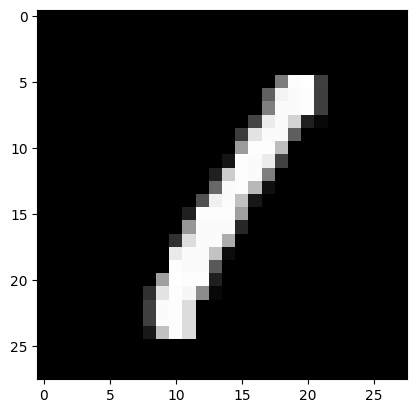

In [ ]:
plt.imshow(train_x[3],cmap='gray')
plt.show()

# Shuffle the data

In [ ]:
training_dataset = tf.data.Dataset.from_tensor_slices((train_x, train_y))
BUFFER_SIZE = 60000
BATCH_SIZE = 100
training_dataset = training_dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
training_dataset = training_dataset.batch(BATCH_SIZE)

#Building Generator and Discriminator

In [2]:
latent_dim = 100
# Generator model
def build_generator(latent_dim,n_classes=10):
    #label input
    label_input = Input(shape=(1,))
    embedding = Embedding(n_classes,50)(label_input)
    embedding = Dense(7*7)(embedding)
    embedding = Reshape((7,7,1))(embedding)
    #noise generator input
    noise_input = Input(shape=(latent_dim,))
    dense = Dense(128*7*7)(noise_input)
    dense = LeakyReLU(0.2)(dense)
    dense = Reshape((7,7,128))(dense)
    combined_layer = Concatenate()([dense,embedding])
    #upsample to 14x14
    conv = Conv2DTranspose(128,(4,4),strides=(2,2),padding='same')(combined_layer)
    conv = LeakyReLU(0.2)(conv) #LeakyRelu is used as the image input is in the range of -1 to 1, so leakyRelu allows that range to work. In case of relu any value below 0 becomes 0 hence simple relu cannot be used
    #upsample to 28x28
    conv2 = Conv2DTranspose(128,(4,4),strides=(2,2),padding='same')(conv)
    conv2 = LeakyReLU(0.2)(conv2)
    #output layer
    out_layer = Conv2D(1,(7,7),activation='tanh',padding='same')(conv2)
    #define model
    model = Model([noise_input,label_input],out_layer) ## Here we can see that it uses a functional api and not sequiential api because it takes two input and gives one output
    return model

# Discriminator model
def build_discriminator(input_shape=(28,28,1),n_classes=10):
    # label input
    label_input = Input(shape=(1,))
    embedding = Embedding(n_classes,50)(label_input)
    embedding = Dense(28*28)(embedding)
    embedding = Reshape((28,28,1))(embedding)
    # image input
    image_input = Input(shape=input_shape)
    combined_layer = Concatenate()([image_input,embedding])
    # downsample
    conv1 = Conv2D(64,(3,3),strides=(2,2),padding='same')(combined_layer)
    conv1 = ReLU()(conv1)
    conv1 = Dropout(0.4)(conv1)
    # downsample
    conv2 = Conv2D(128,(3,3),strides=(2,2),padding='same')(conv1)
    conv2 = ReLU()(conv2)
    conv2 = Flatten()(conv2)
    conv2 = Dropout(0.4)(conv2)
    #ouput
    out_layer = Dense(1,activation='sigmoid')(conv2)
    #define model
    model = Model([image_input,label_input],out_layer)
    return model



# Build the generator and discriminator models
generator = build_generator(latent_dim)
discriminator = build_discriminator()

#optimizer
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.1, beta_2=0.99)
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.1, beta_2=0.99)

# Loss function
def genLossFunc(Disc_Output):
     return K.mean(tf.math.log(1 - Disc_Output))
def discLossFunc(real_output,fake_output):
    # Compute the average log(D(x)) and log(1 - D(G(z)))
    real_loss = tf.reduce_mean(tf.math.log(real_output))
    fake_loss = tf.reduce_mean(tf.math.log(1 - fake_output))

    # Total discriminator loss
    disc_loss = -0.5*(real_loss + fake_loss)
    return disc_loss

discriminator.compile(optimizer=discriminator_optimizer, loss=discLossFunc)

# Compile the generator
generator.compile(optimizer=generator_optimizer, loss=genLossFunc)
generator.summary()
discriminator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 dense_1 (Dense)                (None, 6272)         633472      ['input_2[0][0]']                
                                                                                                  
 embedding (Embedding)          (None, 1, 50)        500         ['input_1[0][0]']                
                                                                                              

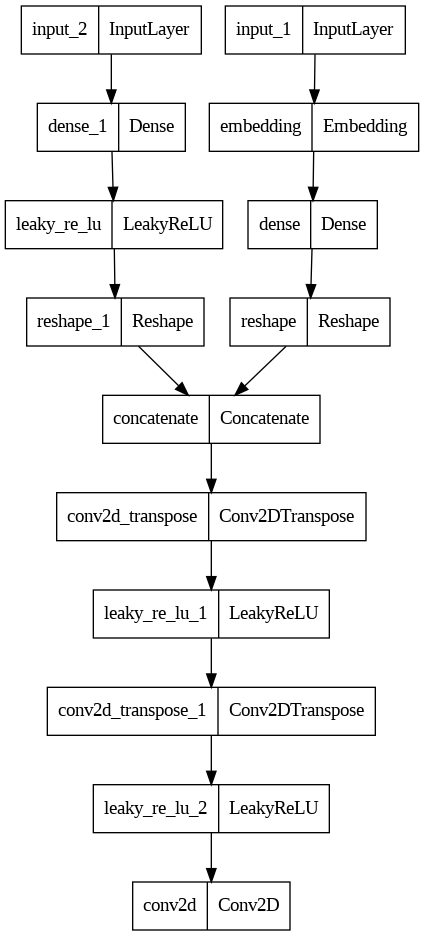

In [ ]:
tf.keras.utils.plot_model(
    generator
)

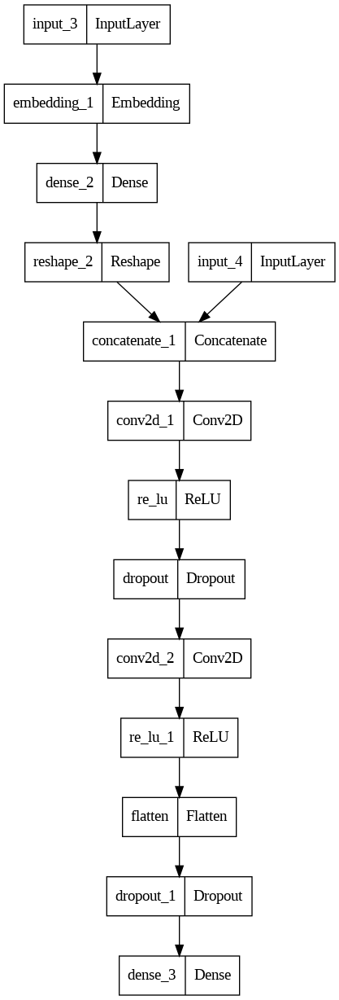

In [ ]:
tf.keras.utils.plot_model(
    discriminator
)

# Show images , Save Model, Load Model functioon

In [ ]:
def show_images(samples=100,name=1,save=True):
    noise = tf.random.normal([samples, 100])
    fake_labels = np.asarray([x for _ in range(10) for x in range(10)])
    generated_imgs = generator.predict([noise,fake_labels])
    fig = plt.figure(figsize=(10,10))
    for i in range(samples):
        ax = fig.add_subplot(10,10,i+1)
        im = np.clip(generated_imgs[i], 0.0, 1.0).squeeze() * 255
        ax.set_title(f"({i%10})")
        ax.imshow(im, cmap="gray", vmin=0, vmax=255)
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    if save:
       fig.savefig(f'content/gdrive/MyDrive/Project/Images/{name}.png')
    plt.close(fig)





def save_model(name=1):
    generator.save_weights(f'content/gdrive/MyDrive/Project/Model/Generator/Gepoch_{name}.ckpt')
    discriminator.save_weights(f'content/gdrive/MyDrive/Project/Model/Discriminator/Depoch_{name}.ckpt')

def load_model(generator,discriminator,Gpath,Dpath):
    generator.load_weights(Gpath)
    discriminator.load_weights(Dpath)




#Load model if previously trained

In [ ]:
#load_model(generator,discriminator,'content/gdrive/MyDrive/Project/Model/Generator/Gepoch_144.ckpt','content/gdrive/MyDrive/Project/Model/Discriminator/Depoch_144.ckpt')

In [ ]:

# Define the training step function
@tf.function
def train_step(real_images,noise,labels,real_labels):


    # Gradient tape to record operations for automatic differentiation
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate fake images using the generator
        fake_images = generator([noise,labels])

        # Discriminator loss for real images
        real_output = discriminator([real_images,real_labels])

        # Discriminator loss for faaake images
        fake_output = discriminator([fake_images,labels])
        total_discriminator_loss = discLossFunc(real_output,fake_output)

        # Generator loss
        generator_loss = genLossFunc(fake_output)

    # Compute gradients for generator and discriminator
    gradients_of_generator = gen_tape.gradient(generator_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(total_discriminator_loss, discriminator.trainable_variables)

    # Apply the gradients to the optimizer
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return generator_loss, total_discriminator_loss


4/4 [==============================] - 0s 6ms/step


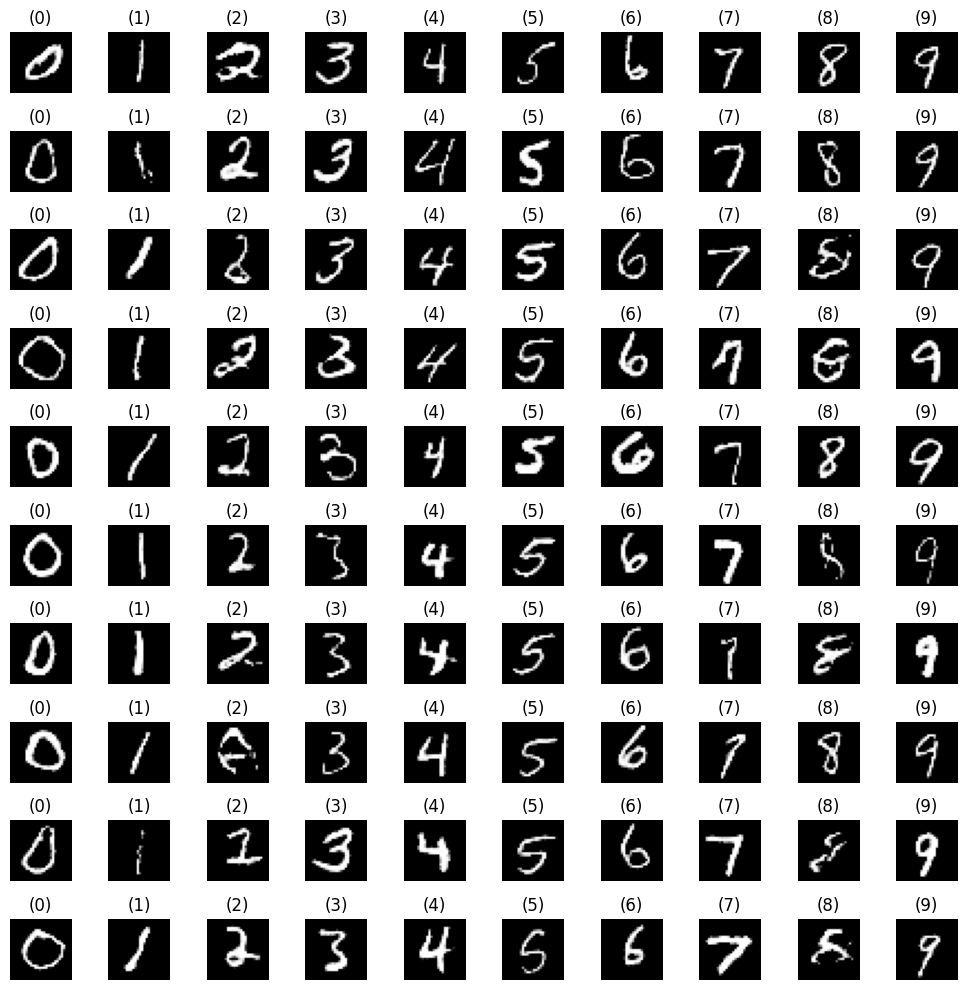

Epoch 101: Generator Loss = -0.6392858624458313, Discriminator Loss = 0.6437202095985413
4/4 [==============================] - 0s 6ms/step


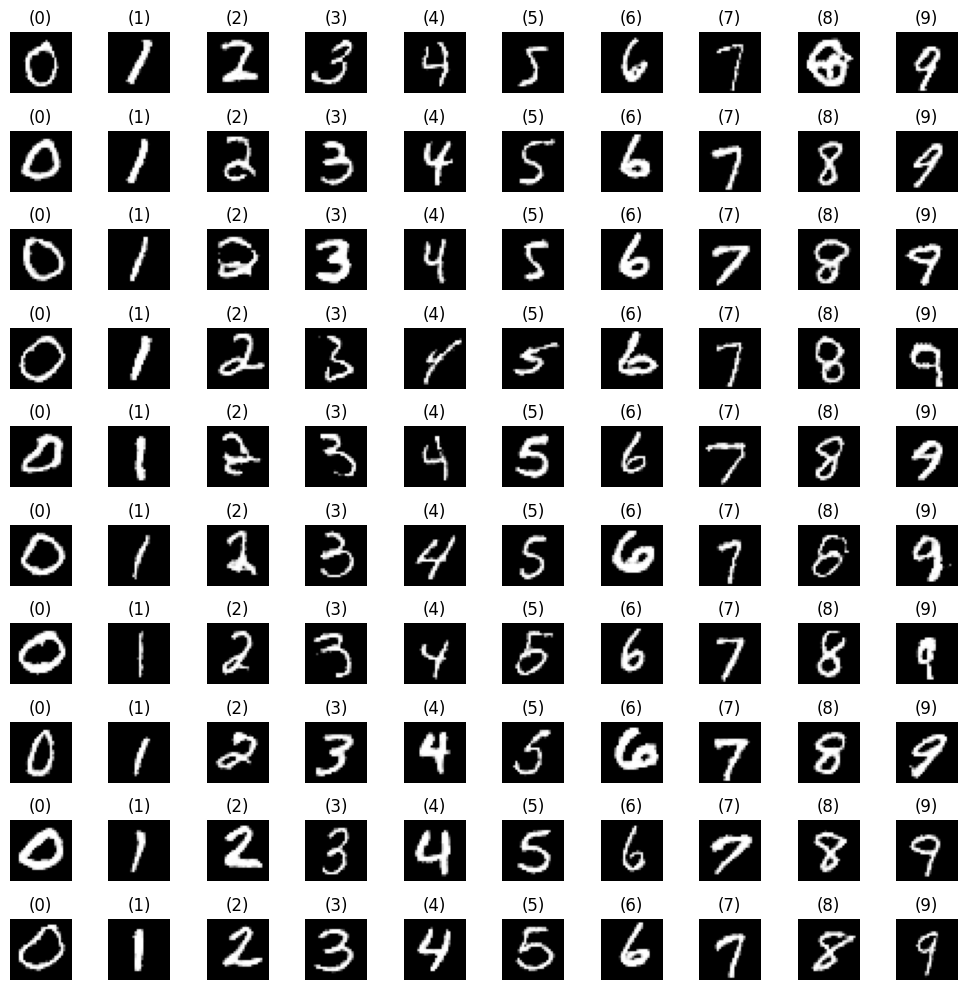

Epoch 102: Generator Loss = -0.6397782564163208, Discriminator Loss = 0.6440025568008423
4/4 [==============================] - 0s 9ms/step


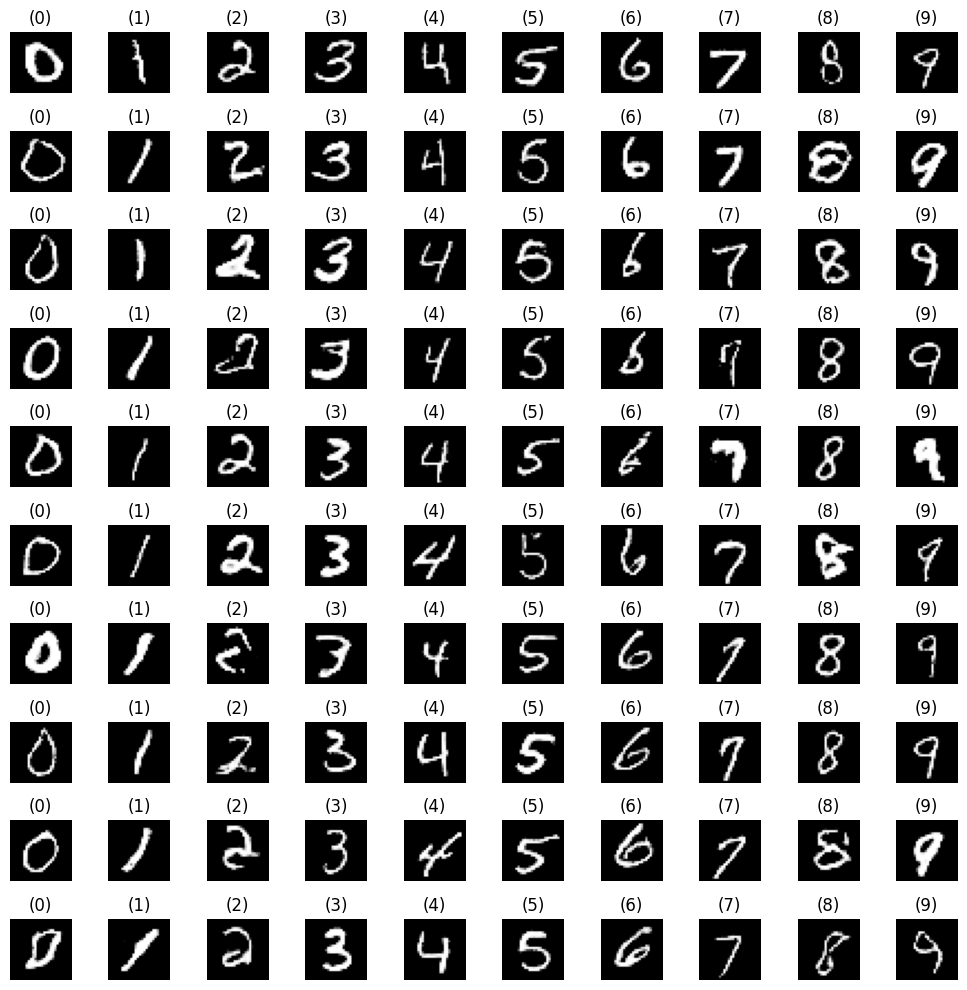

Epoch 103: Generator Loss = -0.6388840675354004, Discriminator Loss = 0.6432401537895203
4/4 [==============================] - 0s 6ms/step


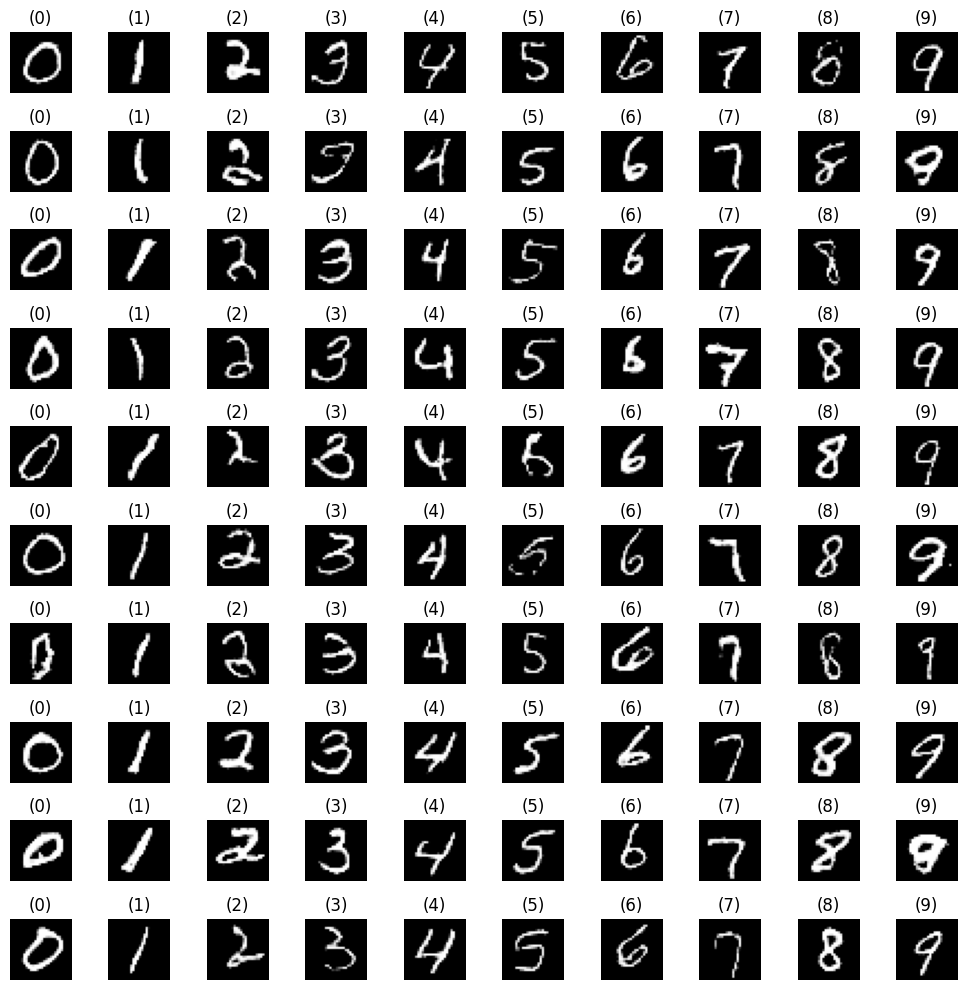

Epoch 104: Generator Loss = -0.6388612985610962, Discriminator Loss = 0.6433978080749512
4/4 [==============================] - 0s 6ms/step


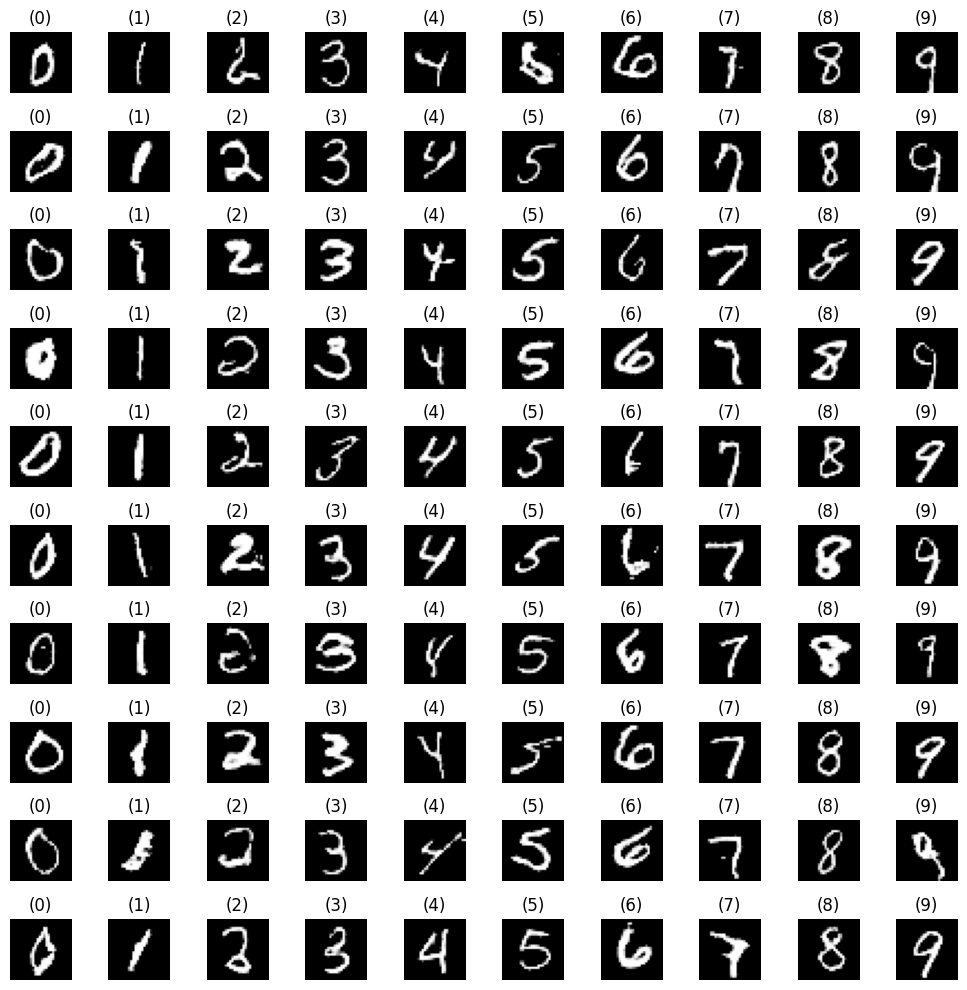

Epoch 105: Generator Loss = -0.6396898031234741, Discriminator Loss = 0.6440144181251526
4/4 [==============================] - 0s 8ms/step


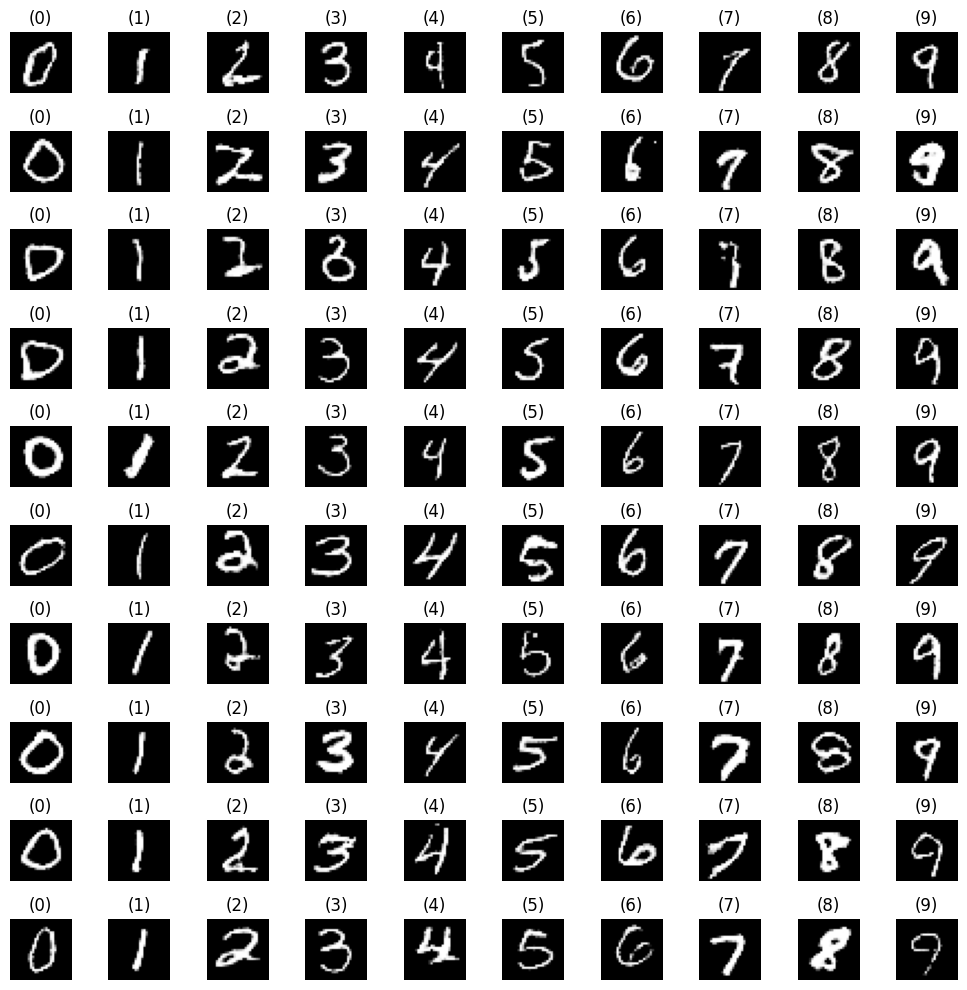

Epoch 106: Generator Loss = -0.6395843029022217, Discriminator Loss = 0.6437642574310303
4/4 [==============================] - 0s 9ms/step


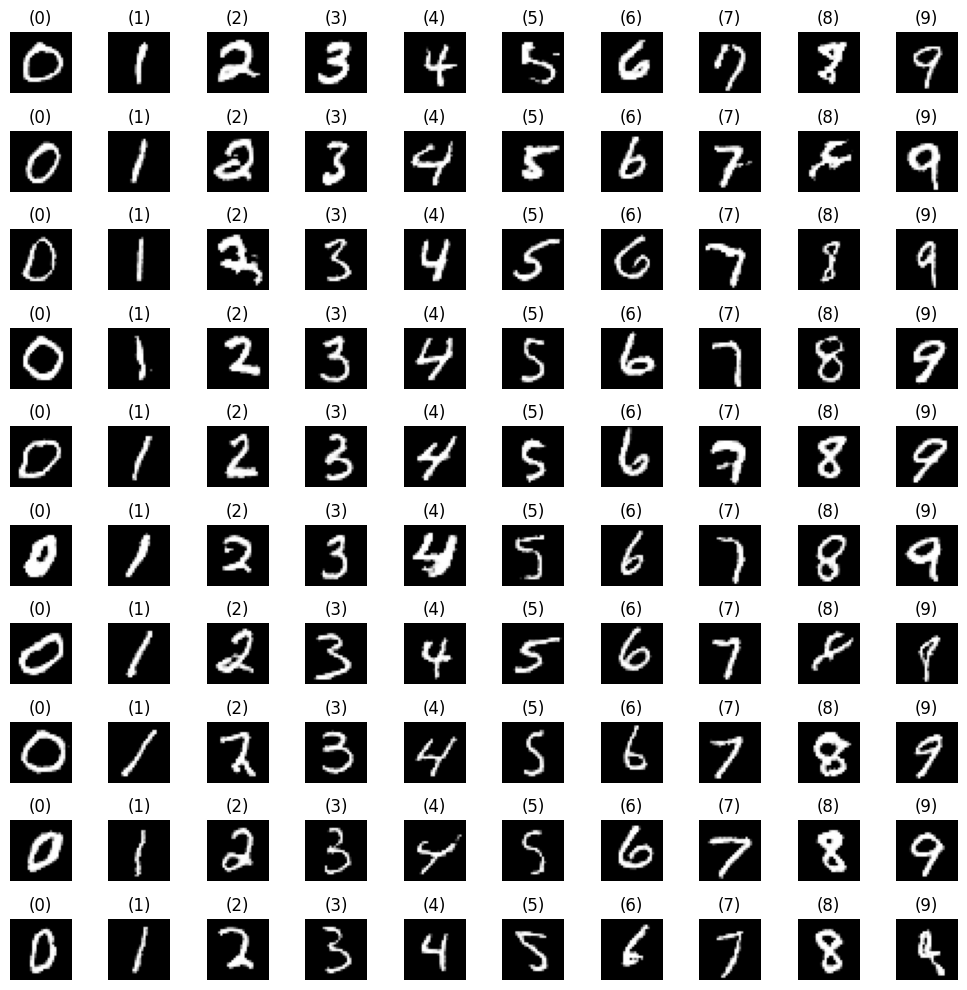

Epoch 107: Generator Loss = -0.6399478316307068, Discriminator Loss = 0.6439544558525085
4/4 [==============================] - 0s 6ms/step


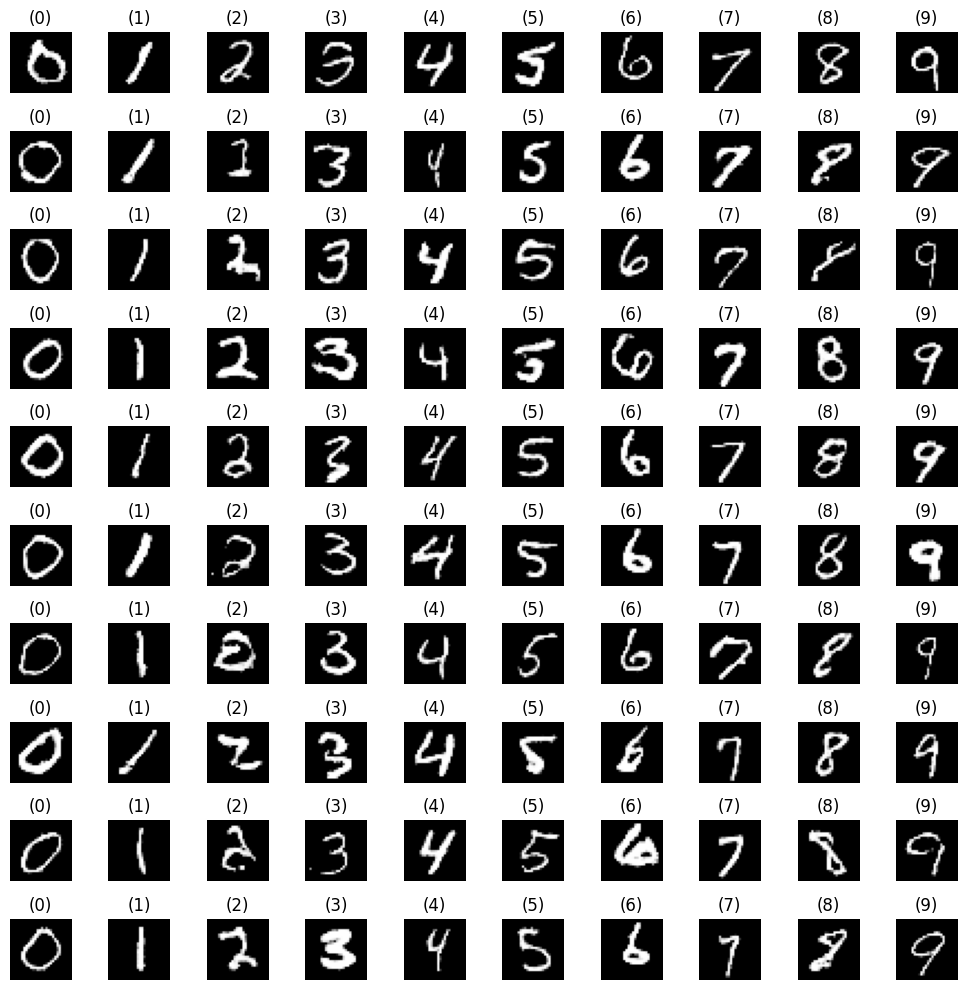

Epoch 108: Generator Loss = -0.6384861469268799, Discriminator Loss = 0.6431387066841125
4/4 [==============================] - 0s 12ms/step


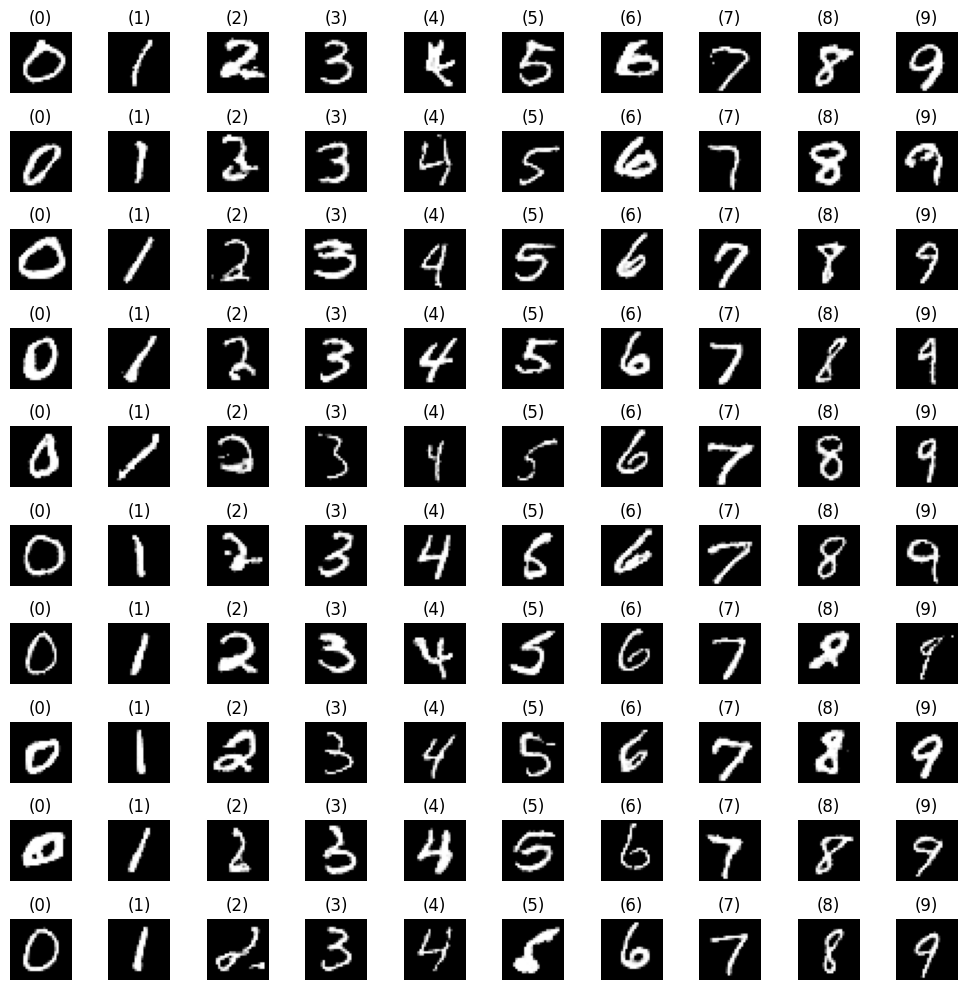

Epoch 109: Generator Loss = -0.6391534209251404, Discriminator Loss = 0.6434112787246704
4/4 [==============================] - 0s 7ms/step


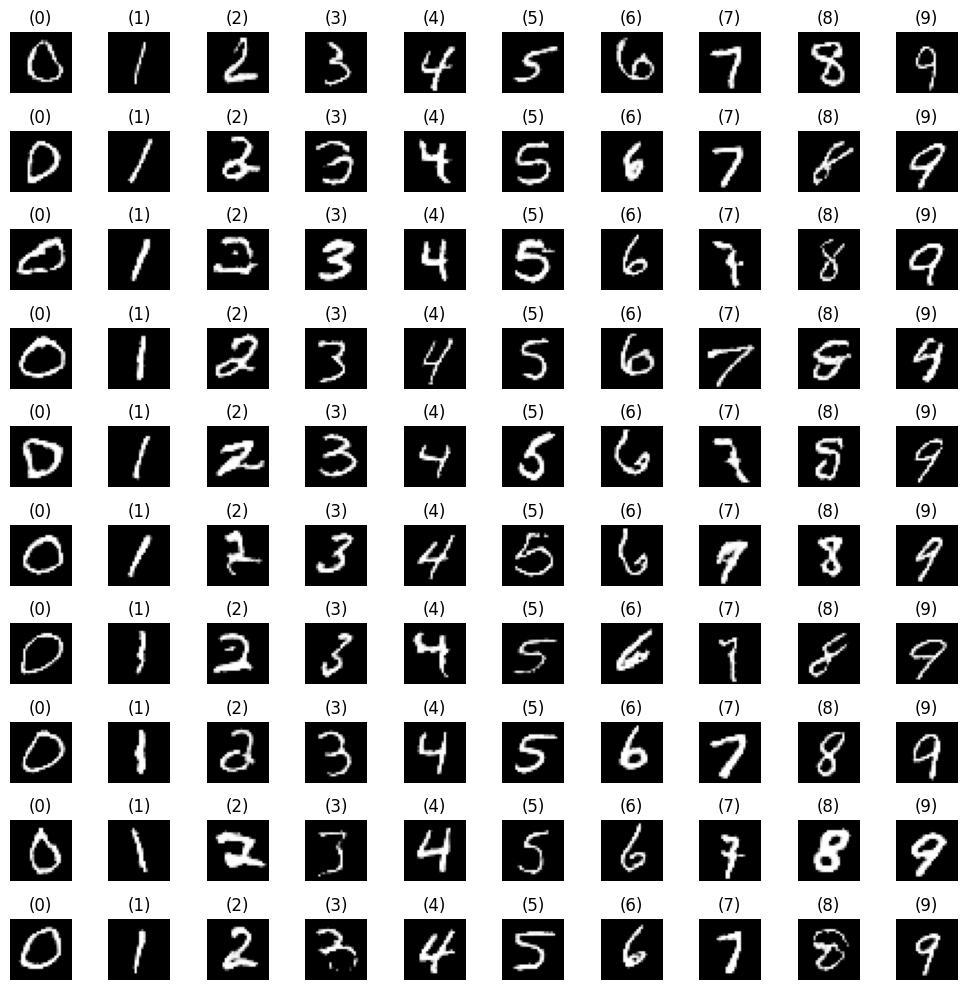

Epoch 110: Generator Loss = -0.6383752226829529, Discriminator Loss = 0.6429416537284851
4/4 [==============================] - 0s 8ms/step


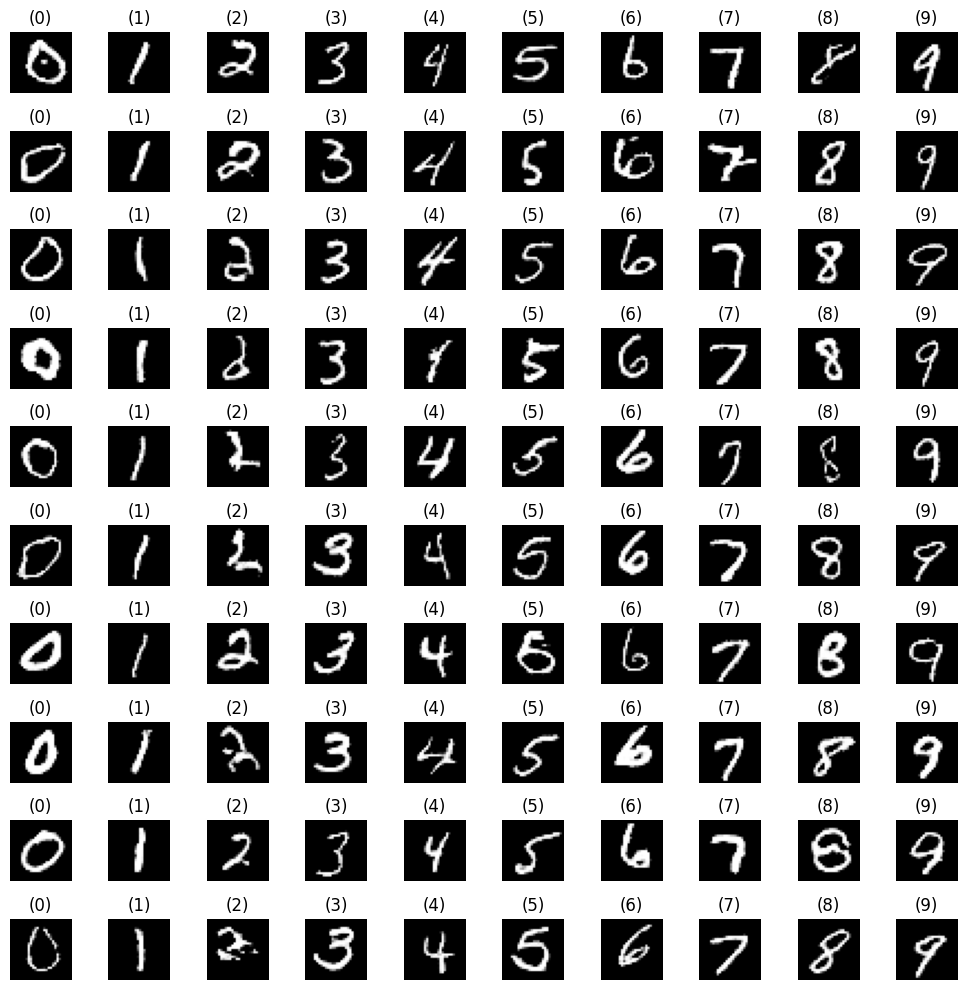

Epoch 111: Generator Loss = -0.6387499570846558, Discriminator Loss = 0.6431019306182861
4/4 [==============================] - 0s 12ms/step


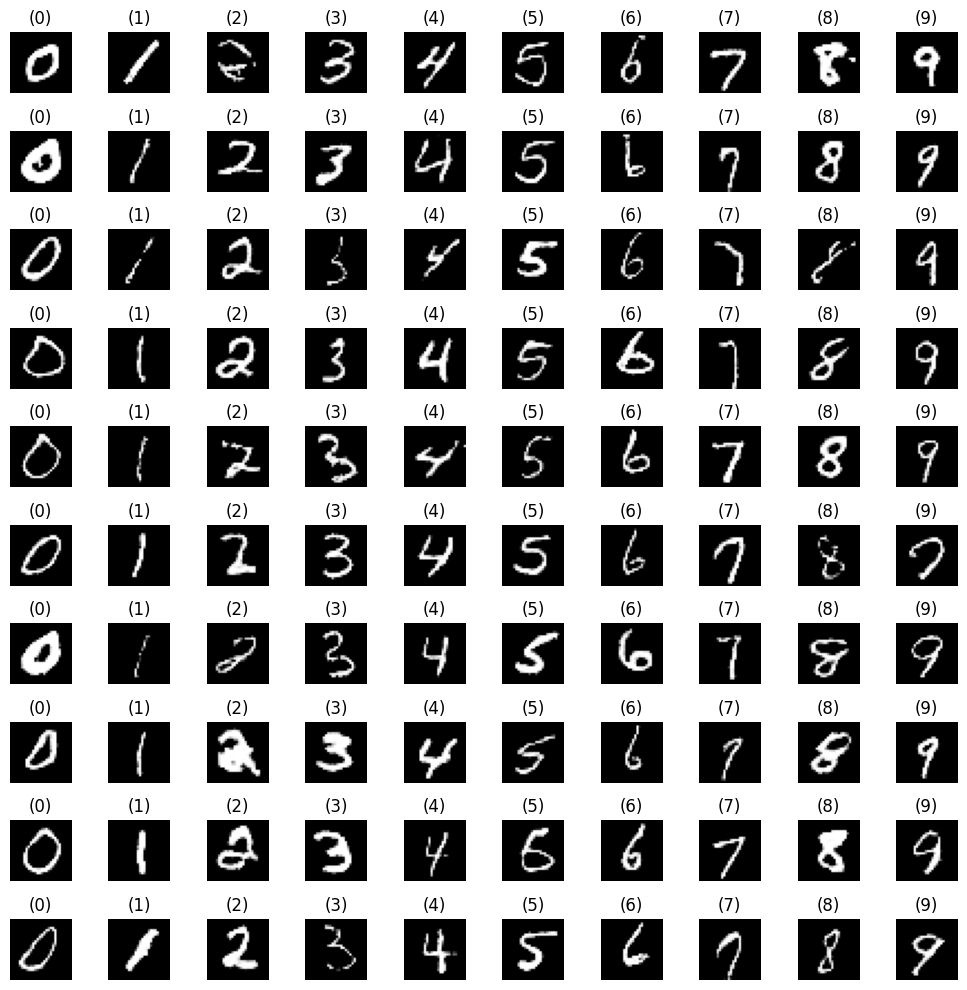

Epoch 112: Generator Loss = -0.6388769149780273, Discriminator Loss = 0.6435109972953796
4/4 [==============================] - 0s 7ms/step


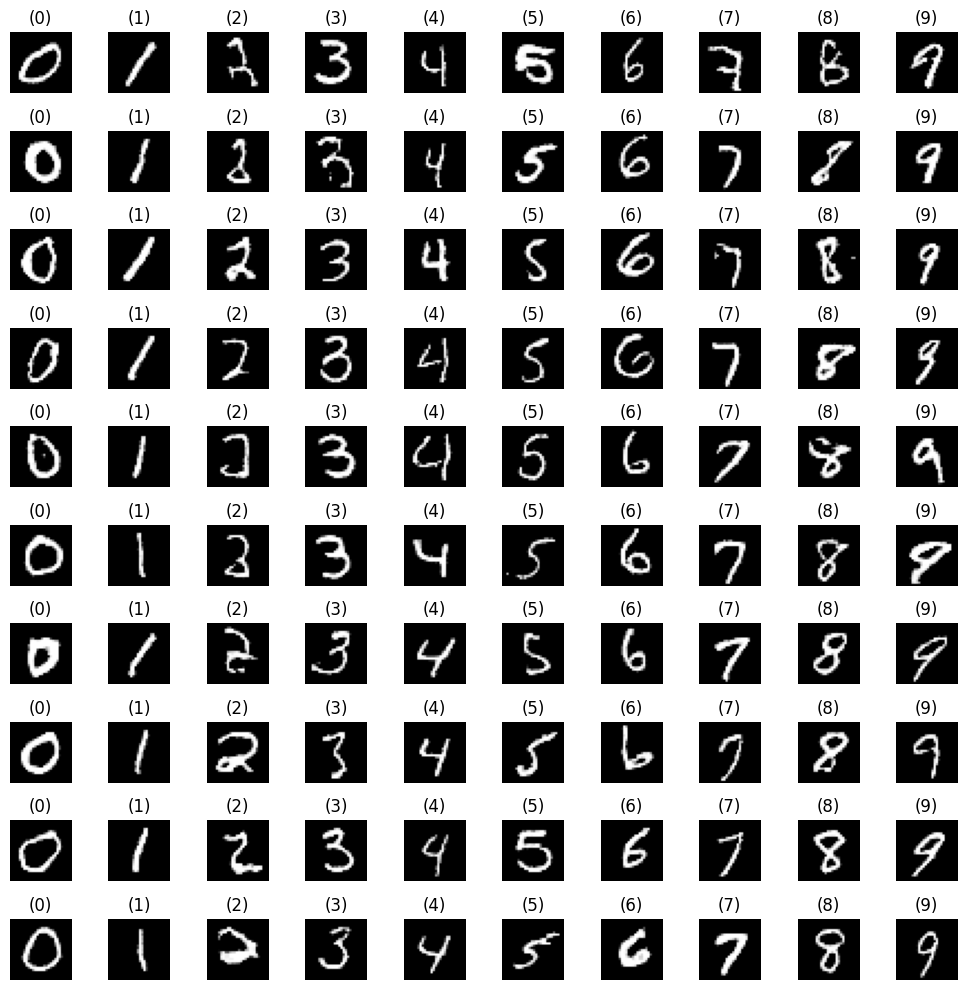

Epoch 113: Generator Loss = -0.639498770236969, Discriminator Loss = 0.6436180472373962
4/4 [==============================] - 0s 9ms/step


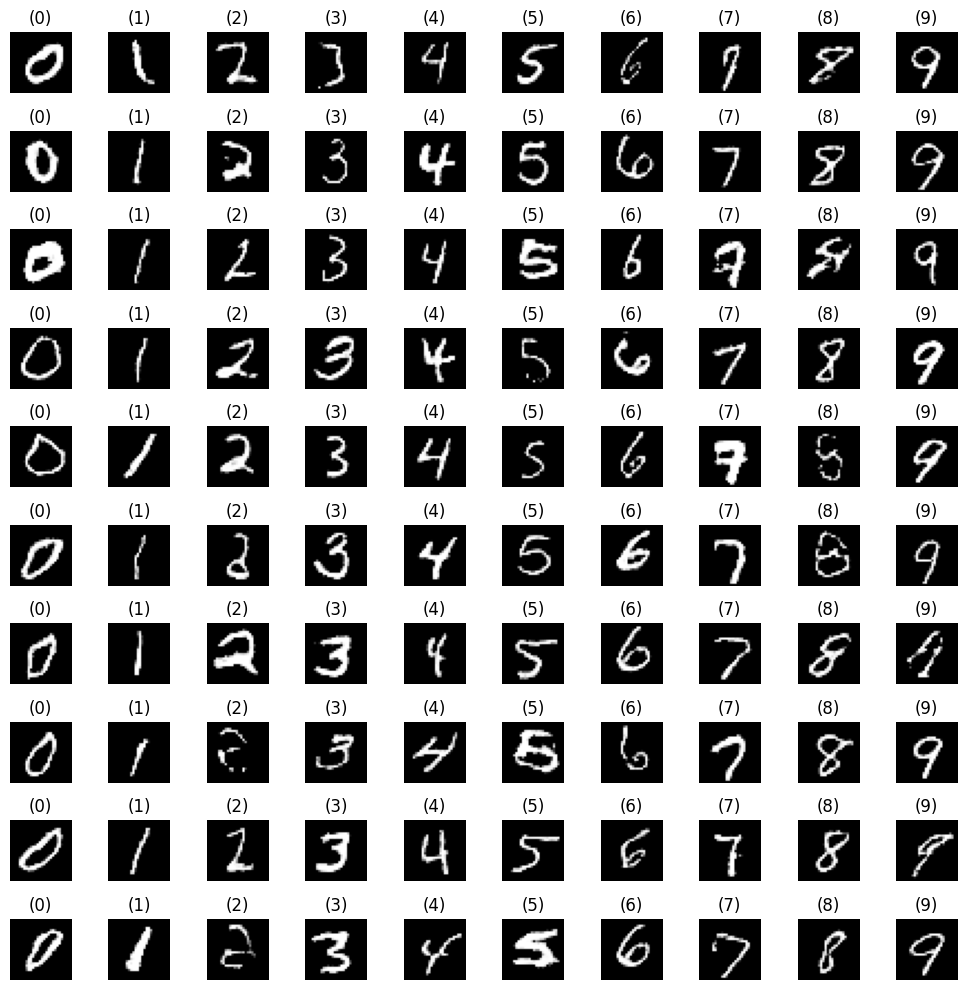

Epoch 114: Generator Loss = -0.6390194296836853, Discriminator Loss = 0.6433907747268677
4/4 [==============================] - 0s 11ms/step


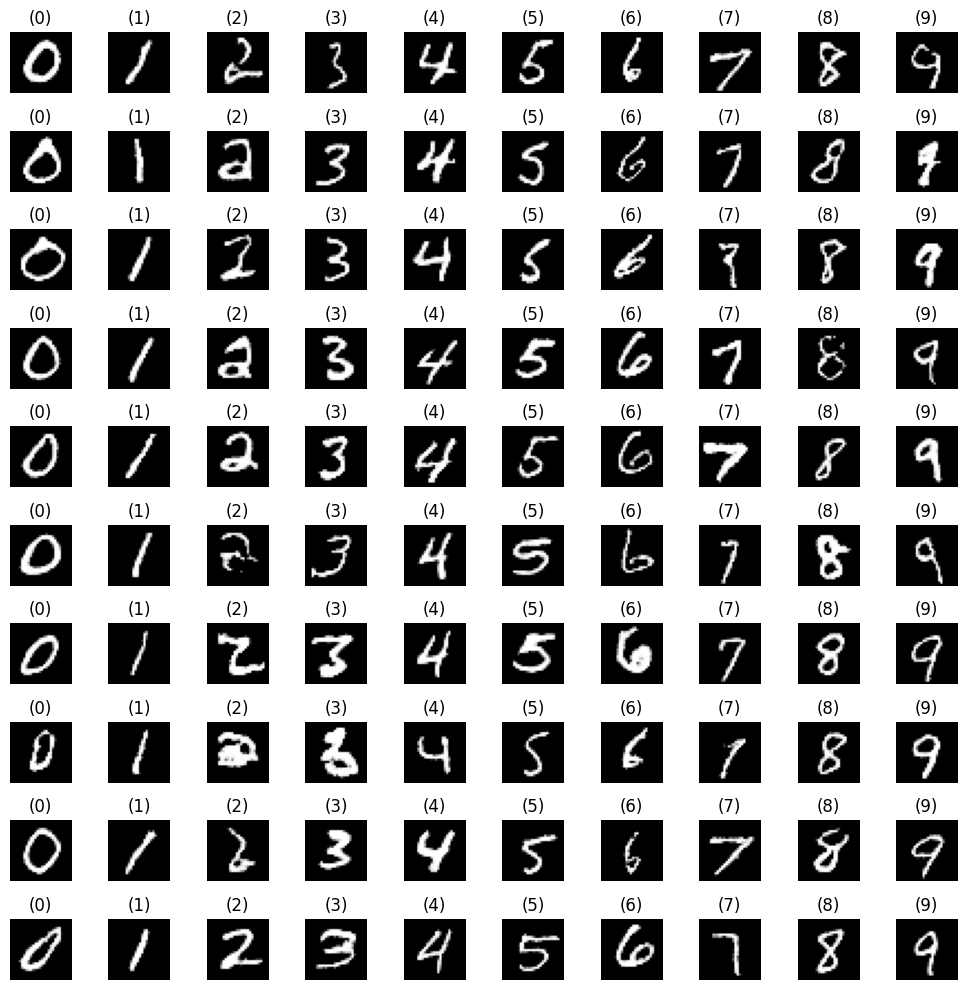

Epoch 115: Generator Loss = -0.6394500136375427, Discriminator Loss = 0.6435064673423767
4/4 [==============================] - 0s 8ms/step


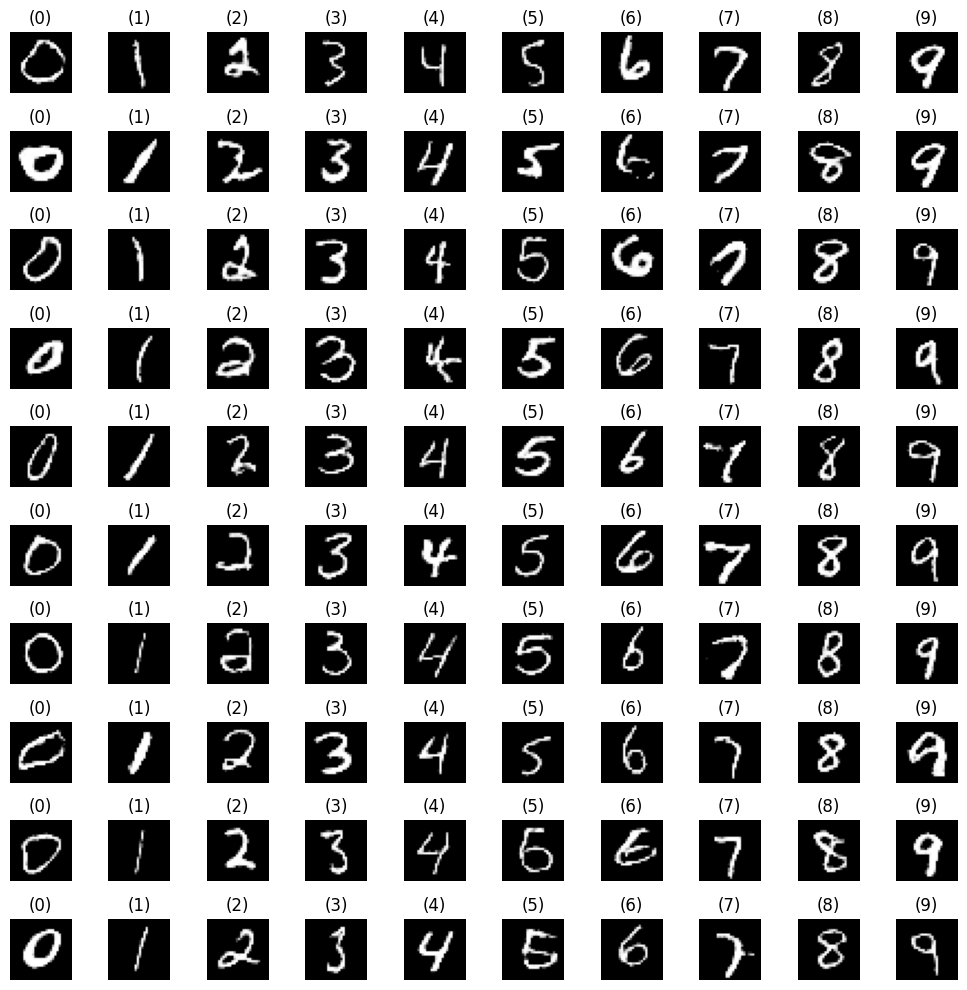

Epoch 116: Generator Loss = -0.6387225985527039, Discriminator Loss = 0.6431937217712402
4/4 [==============================] - 0s 10ms/step


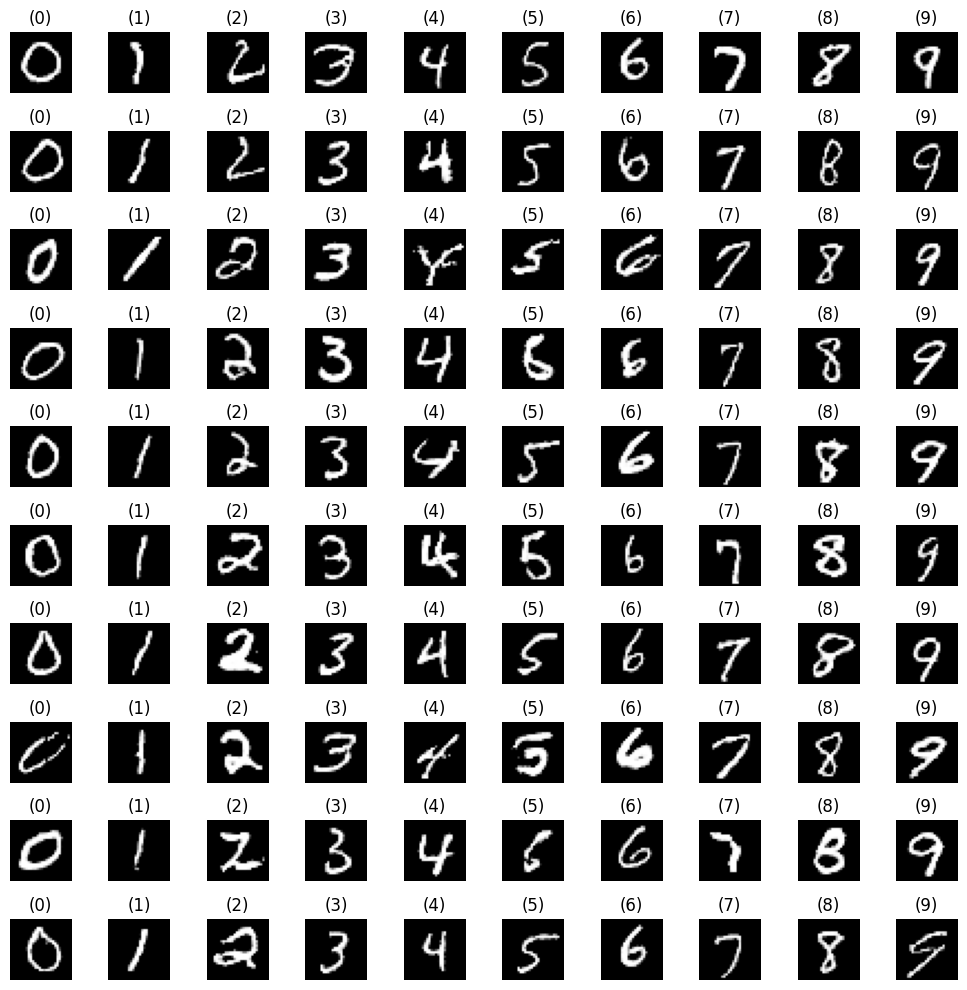

Epoch 117: Generator Loss = -0.6394054889678955, Discriminator Loss = 0.6438837647438049
4/4 [==============================] - 0s 8ms/step


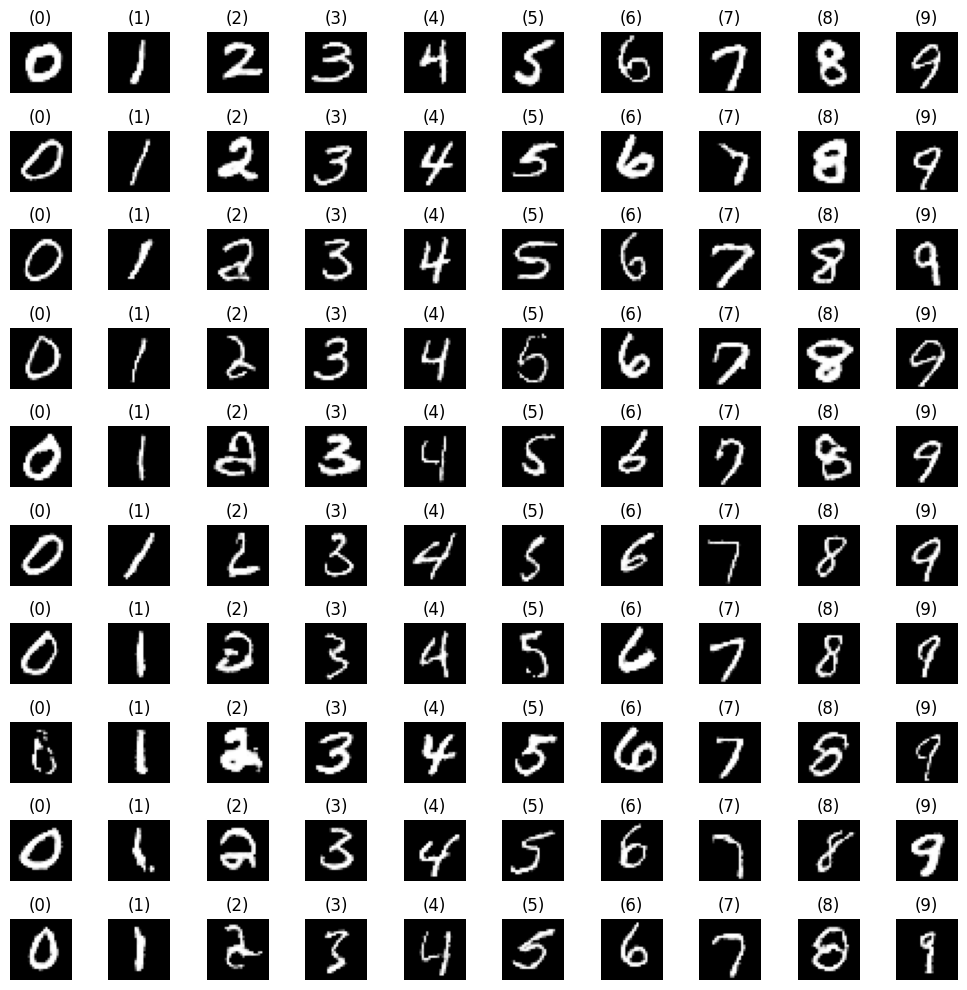

Epoch 118: Generator Loss = -0.6397892236709595, Discriminator Loss = 0.6443005204200745
4/4 [==============================] - 0s 8ms/step


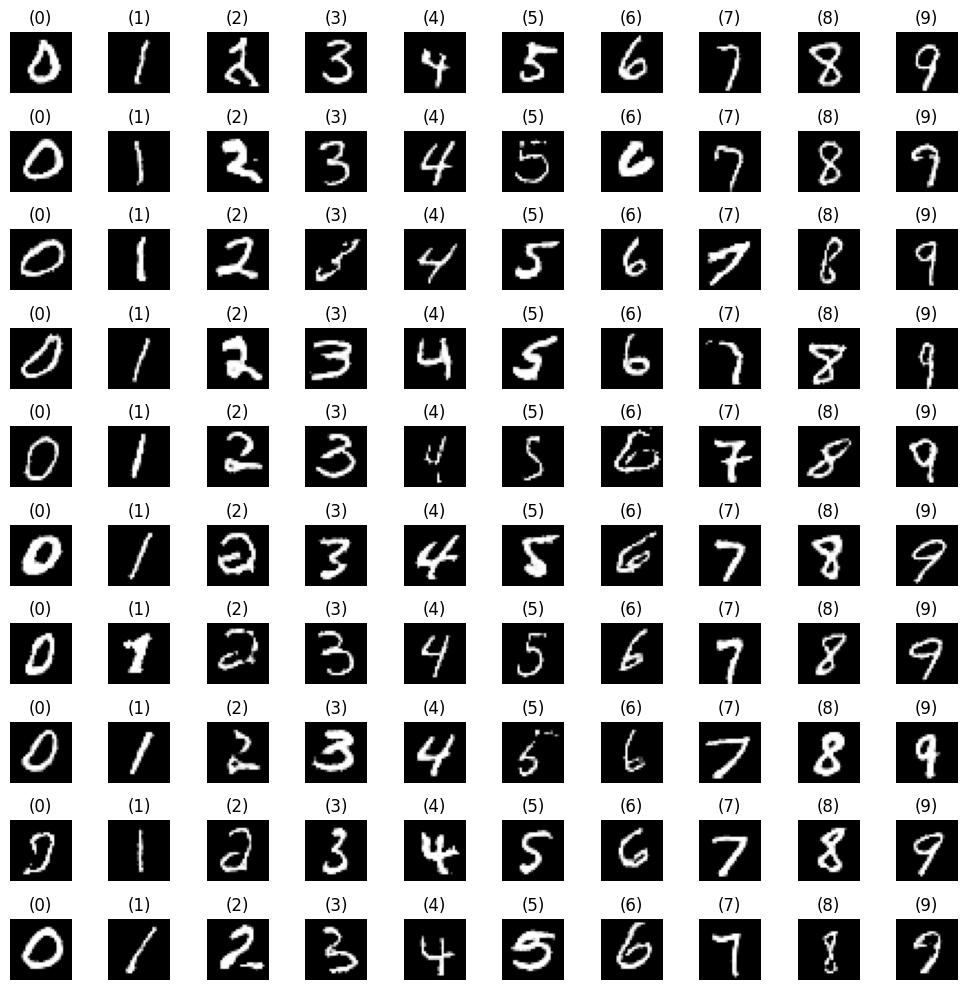

Epoch 119: Generator Loss = -0.6405433416366577, Discriminator Loss = 0.6444445848464966
4/4 [==============================] - 0s 9ms/step


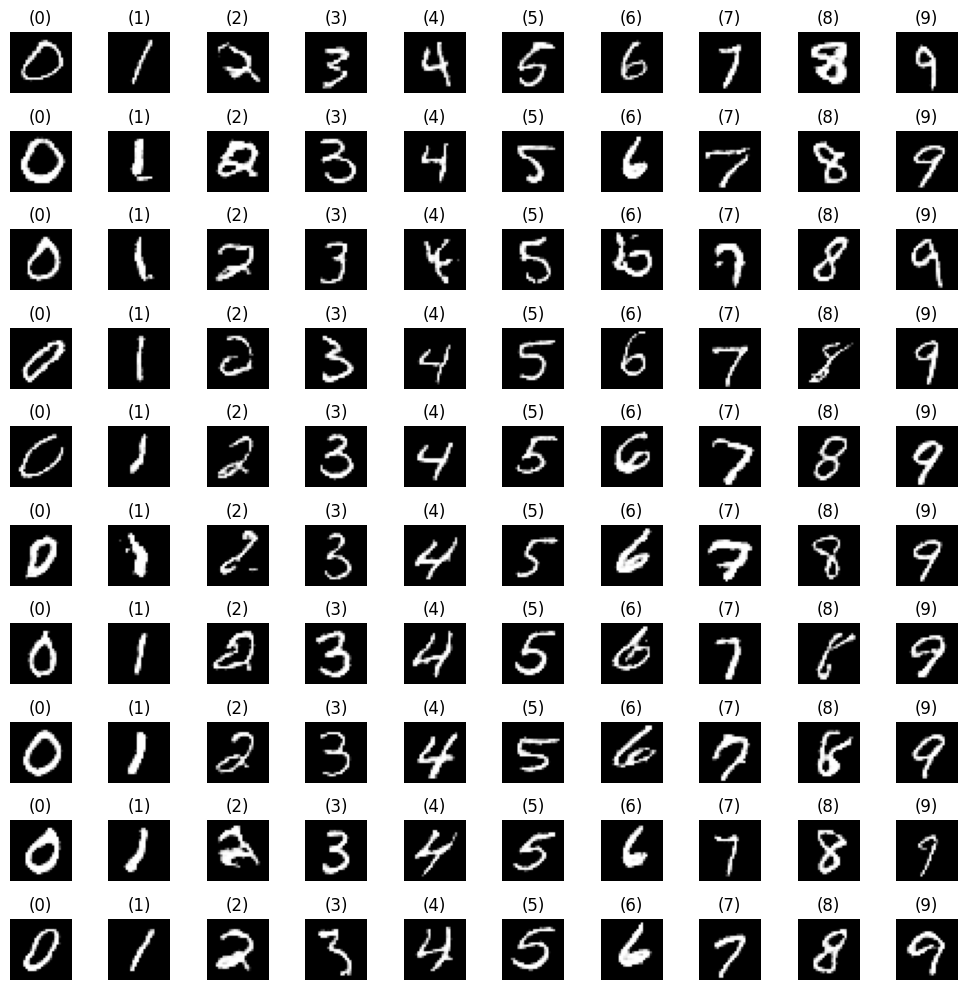

Epoch 120: Generator Loss = -0.6400228142738342, Discriminator Loss = 0.6444122791290283
4/4 [==============================] - 0s 6ms/step


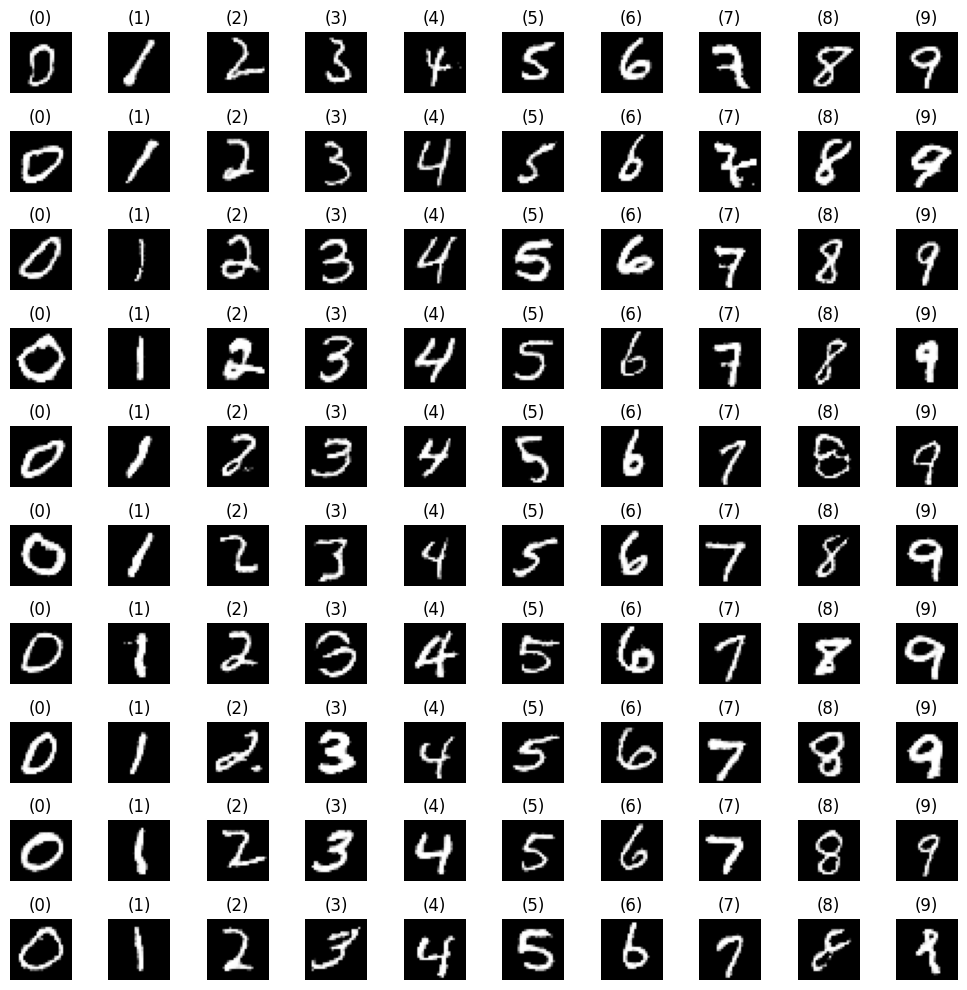

Epoch 121: Generator Loss = -0.6398362517356873, Discriminator Loss = 0.6440532207489014
4/4 [==============================] - 0s 6ms/step


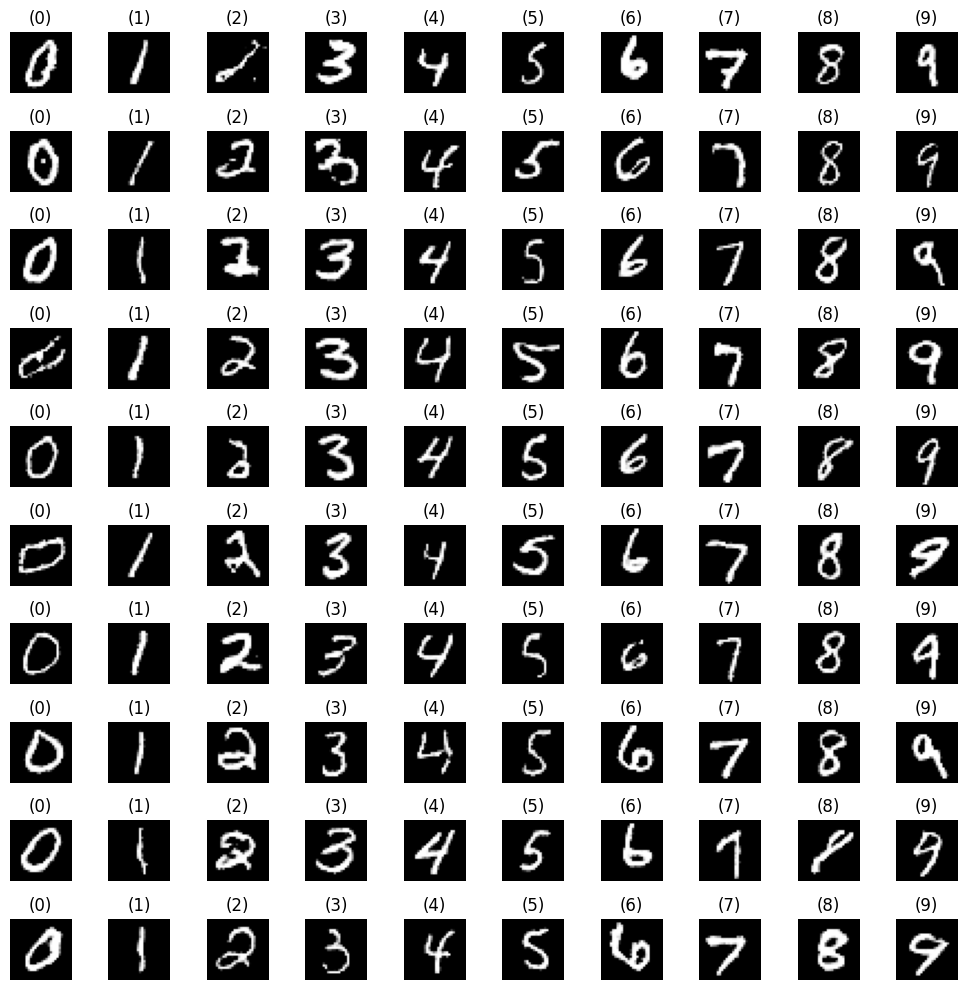

Epoch 122: Generator Loss = -0.6394177675247192, Discriminator Loss = 0.6439064741134644
4/4 [==============================] - 0s 9ms/step


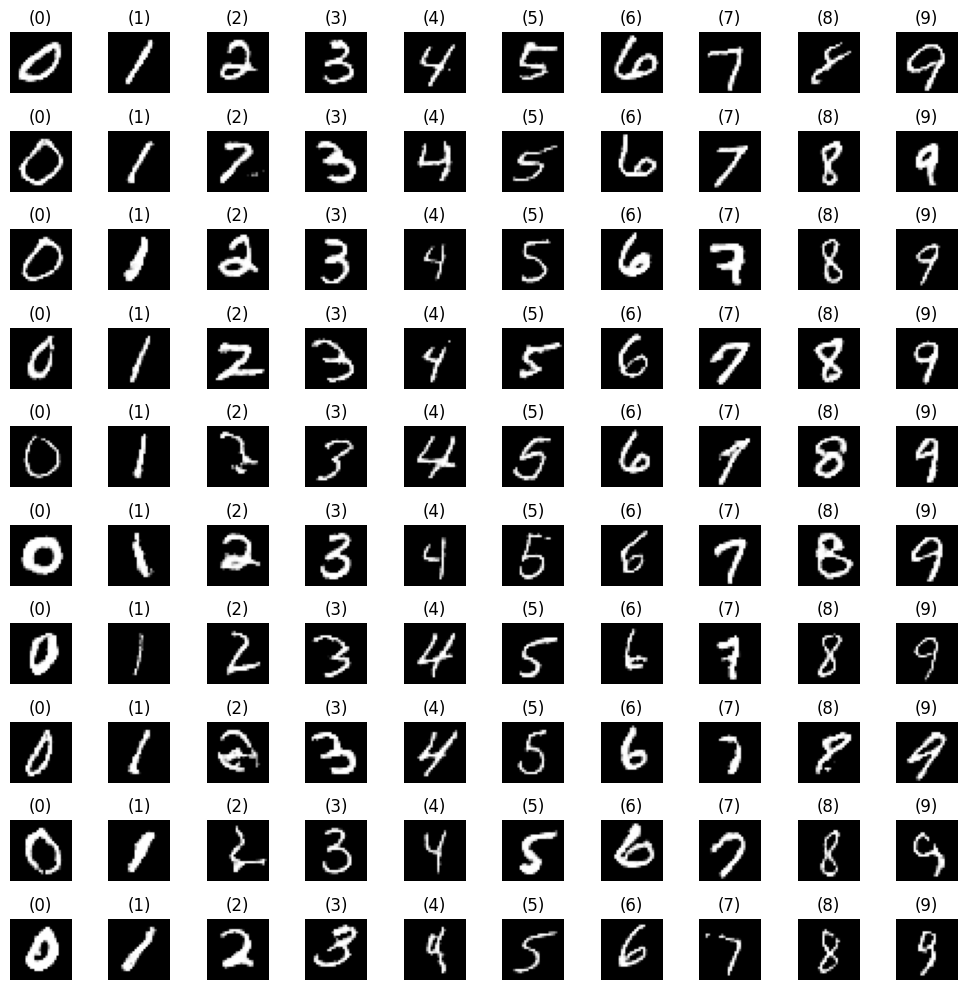

Epoch 123: Generator Loss = -0.639447808265686, Discriminator Loss = 0.6438149809837341
4/4 [==============================] - 0s 8ms/step


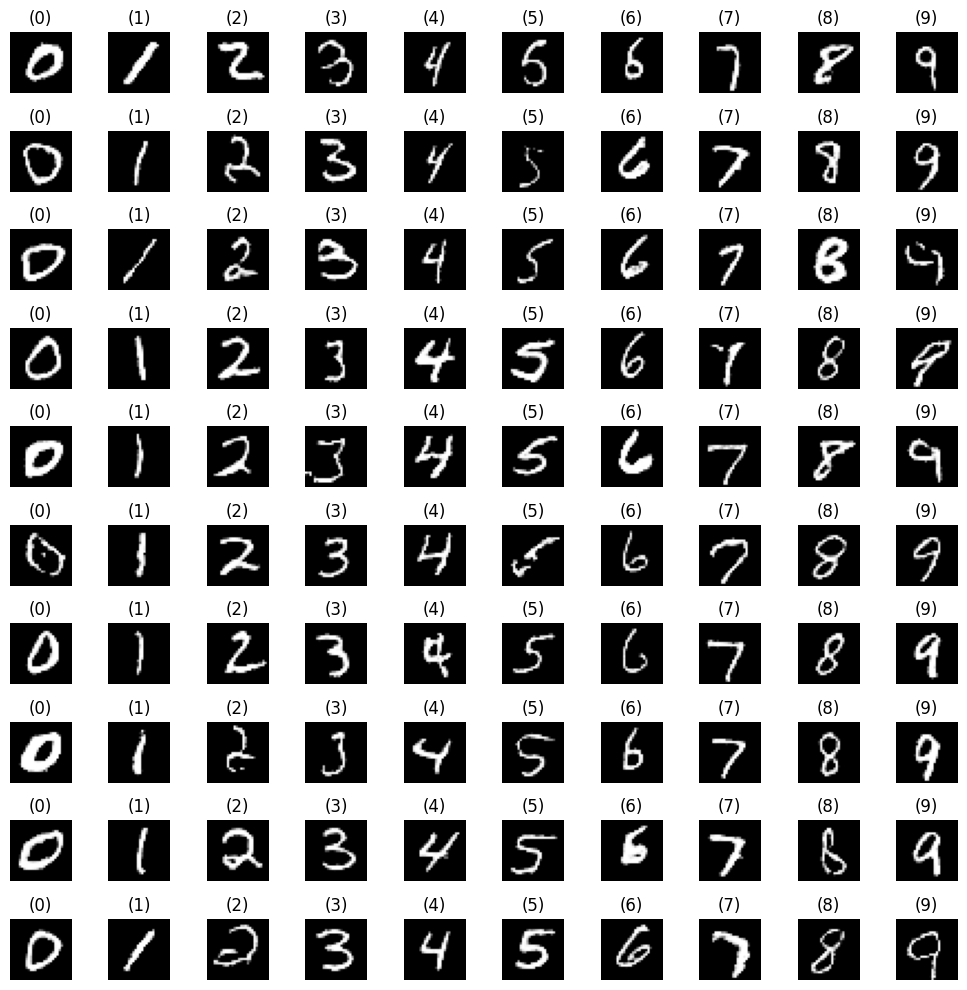

Epoch 124: Generator Loss = -0.6406070590019226, Discriminator Loss = 0.6448493003845215
4/4 [==============================] - 0s 6ms/step


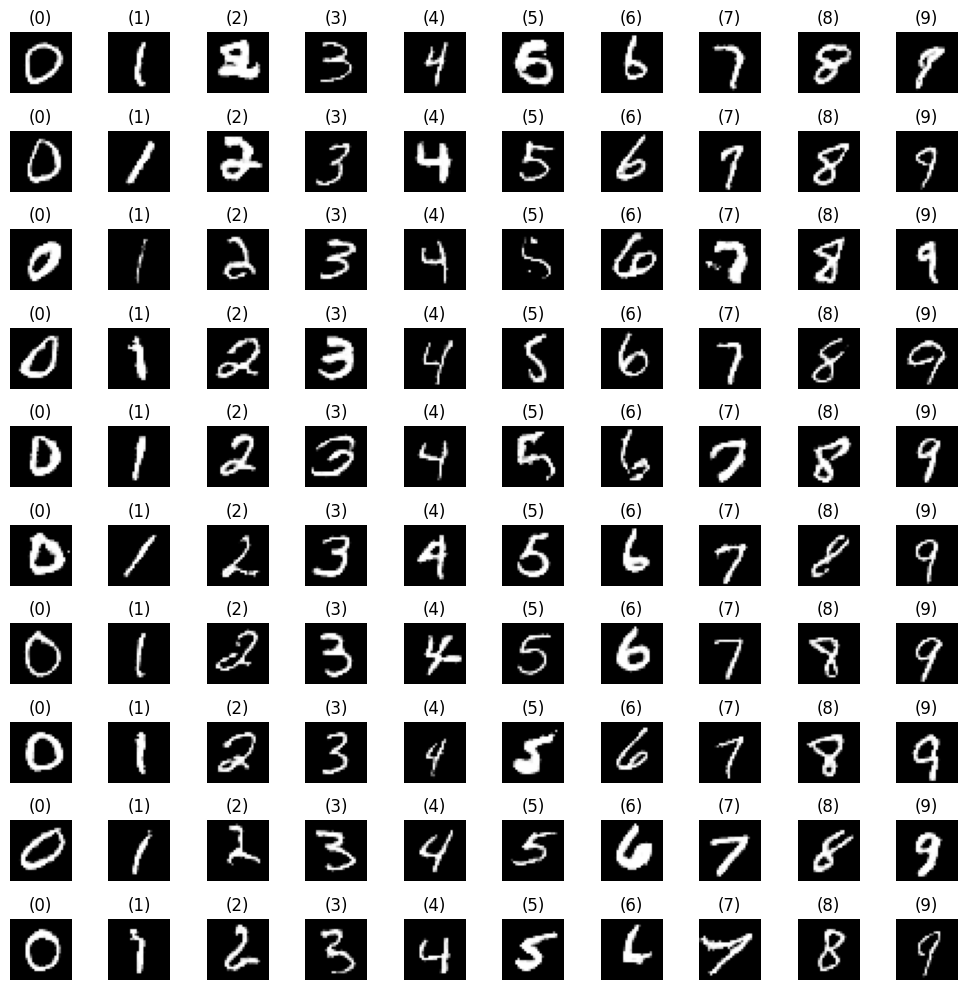

Epoch 125: Generator Loss = -0.6412255167961121, Discriminator Loss = 0.6456267237663269
4/4 [==============================] - 0s 7ms/step


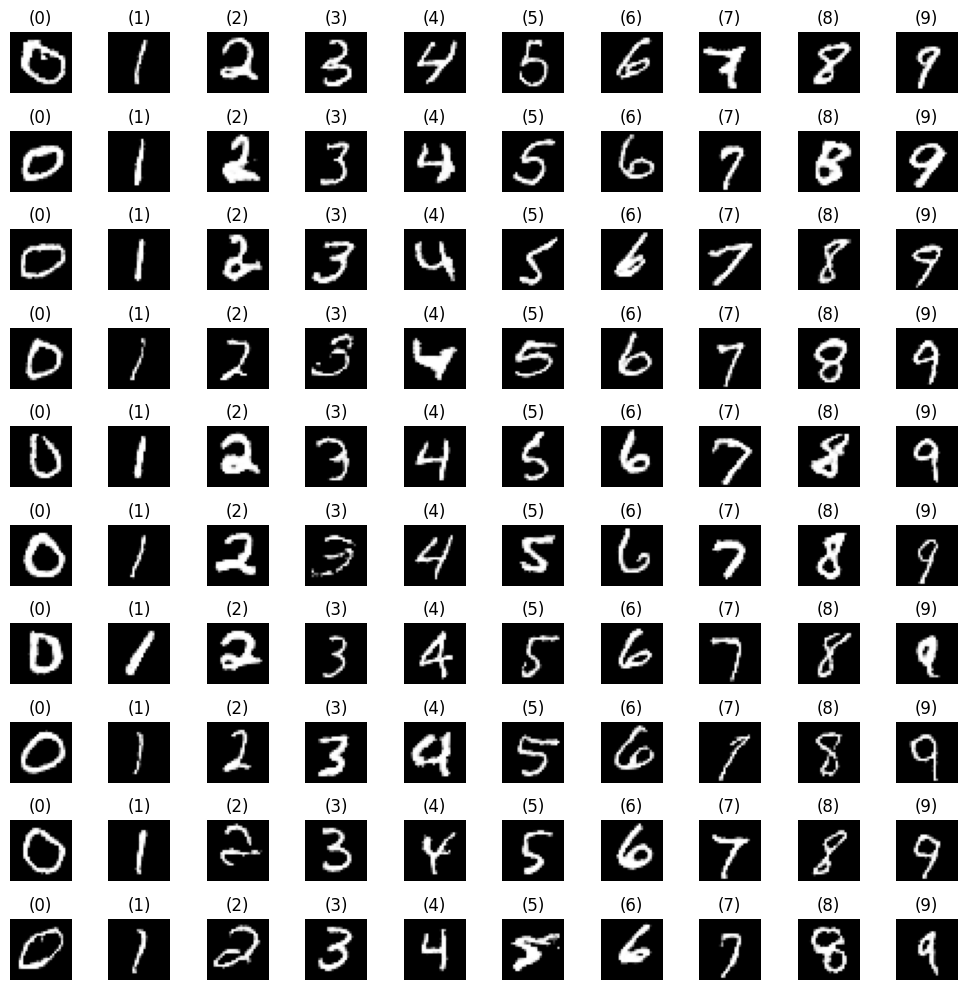

Epoch 126: Generator Loss = -0.6406872272491455, Discriminator Loss = 0.6448348760604858
4/4 [==============================] - 0s 12ms/step


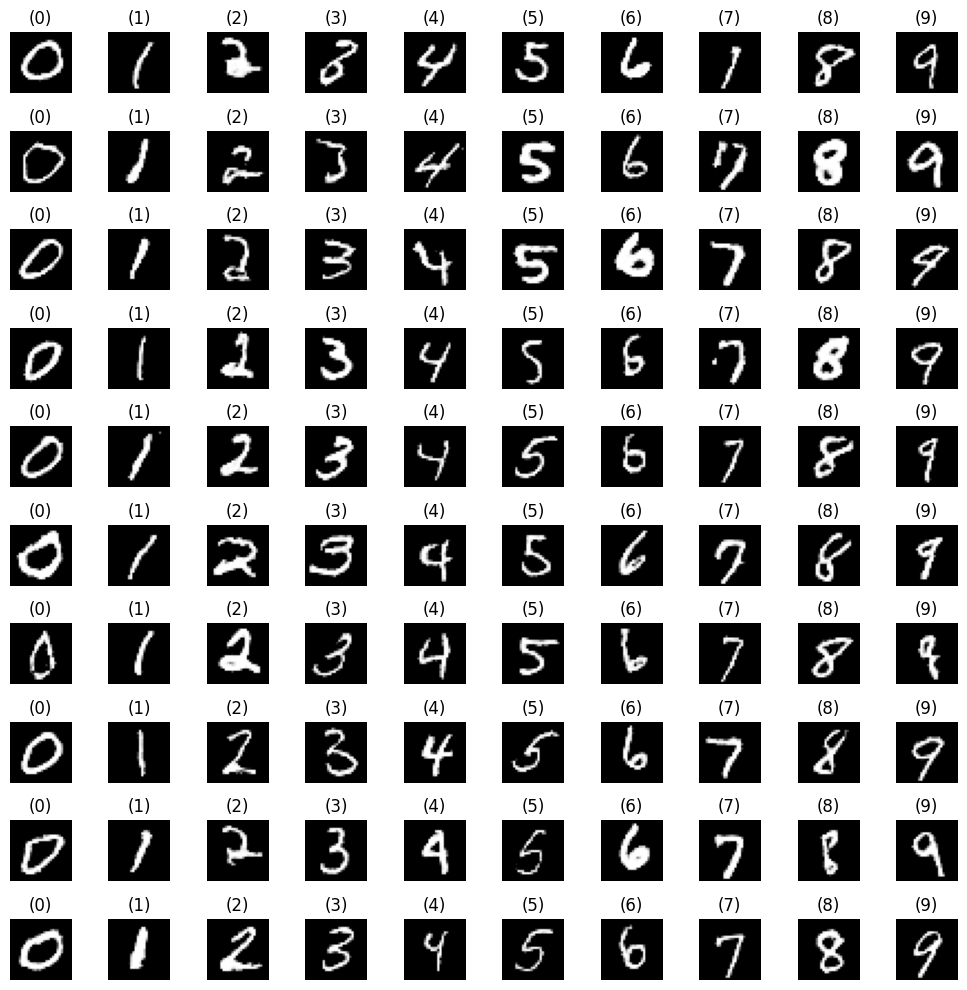

Epoch 127: Generator Loss = -0.6399128437042236, Discriminator Loss = 0.6445739269256592
4/4 [==============================] - 0s 9ms/step


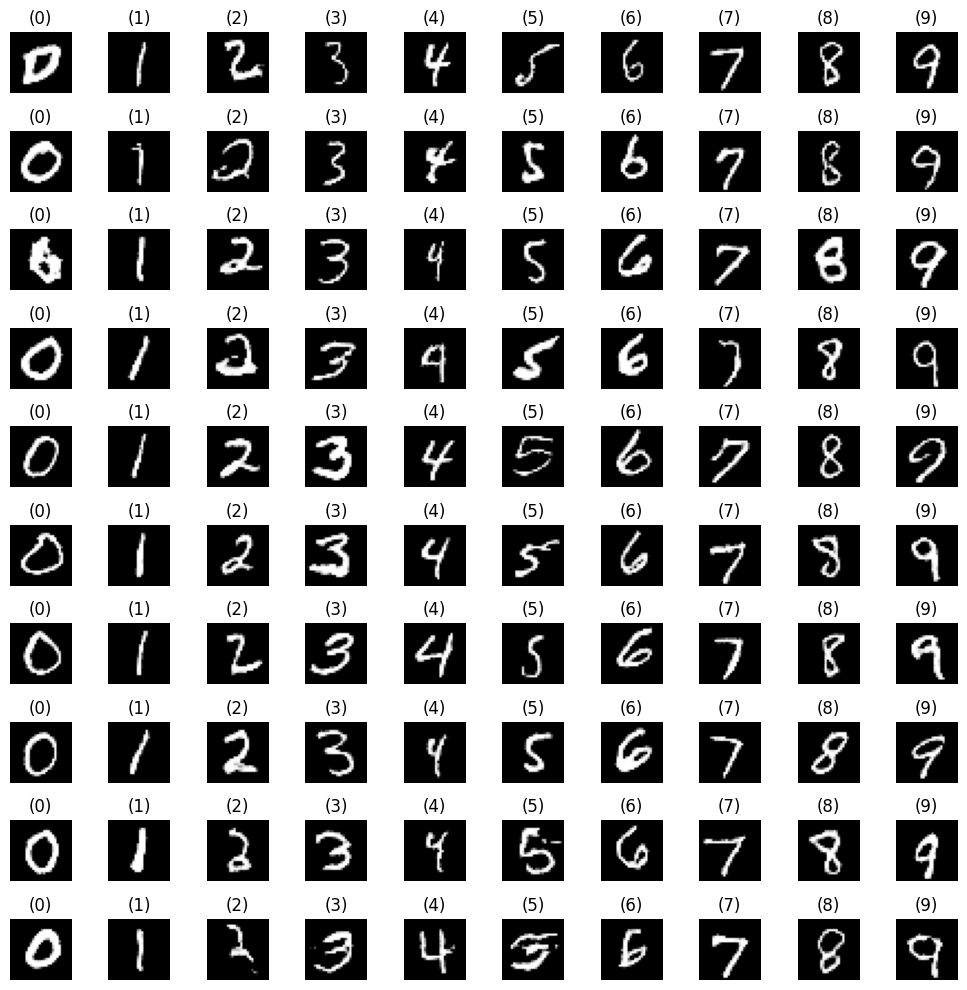

Epoch 128: Generator Loss = -0.6399903893470764, Discriminator Loss = 0.6442728638648987
4/4 [==============================] - 0s 11ms/step


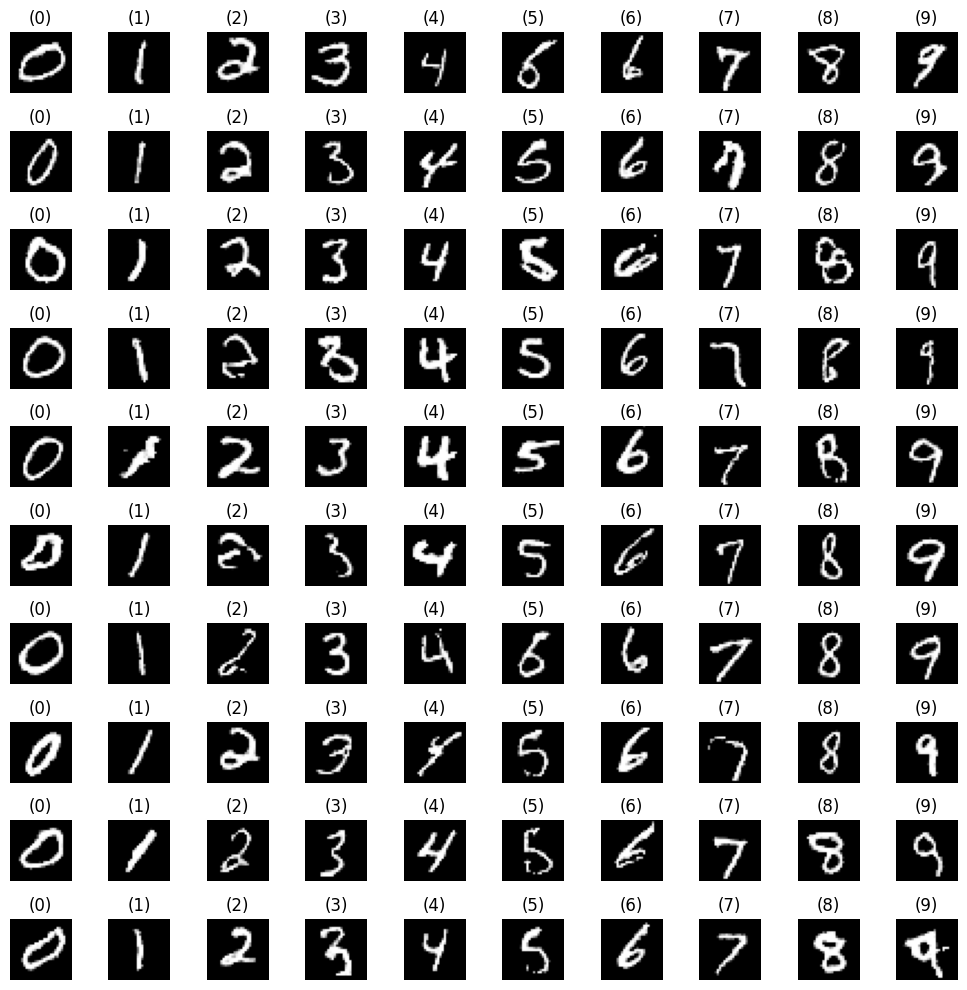

Epoch 129: Generator Loss = -0.6399083137512207, Discriminator Loss = 0.6445033550262451
4/4 [==============================] - 0s 6ms/step


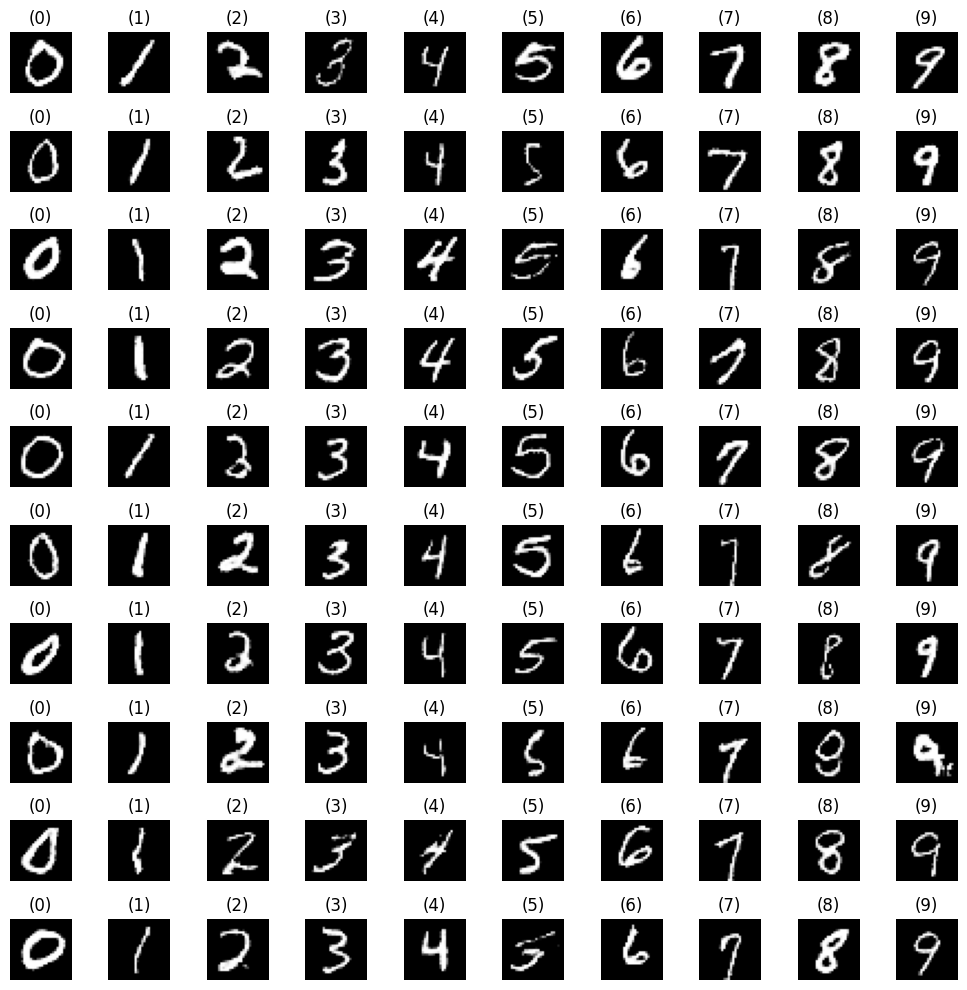

Epoch 130: Generator Loss = -0.6418465971946716, Discriminator Loss = 0.6461030840873718
4/4 [==============================] - 0s 6ms/step


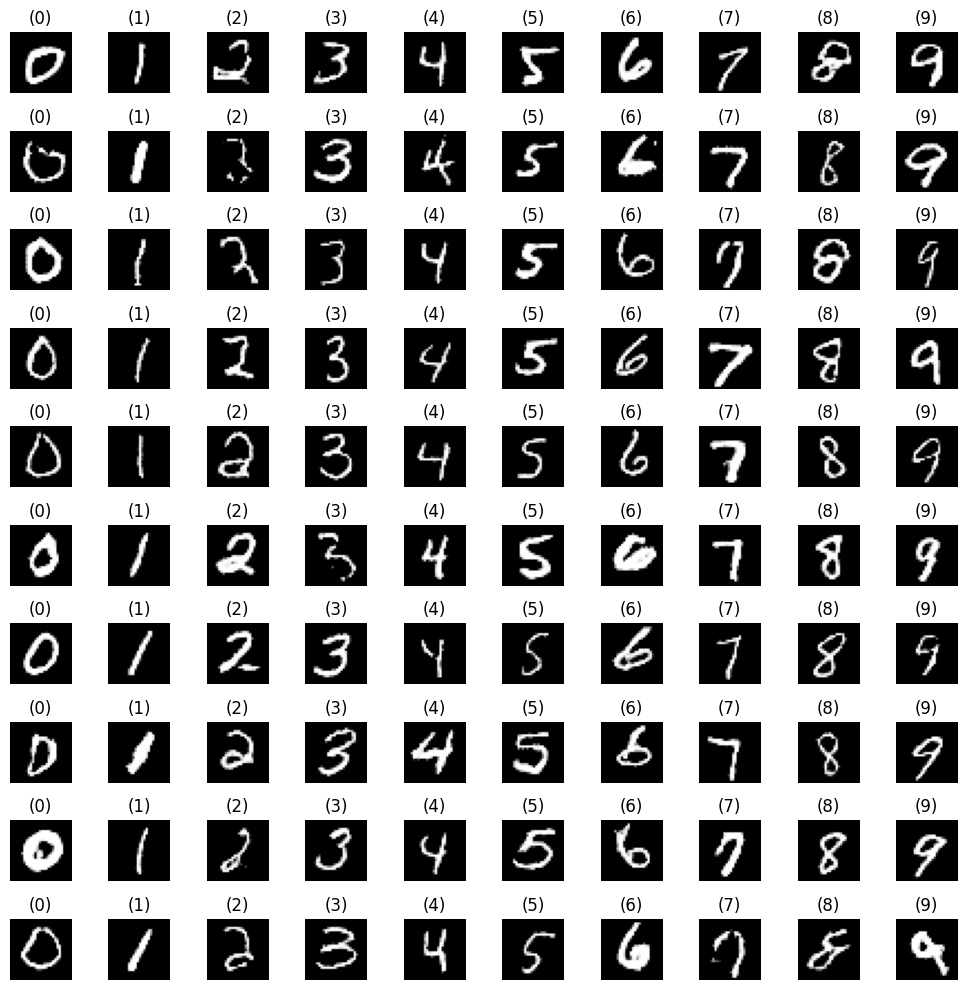

Epoch 131: Generator Loss = -0.6401939392089844, Discriminator Loss = 0.6449487805366516
4/4 [==============================] - 0s 11ms/step


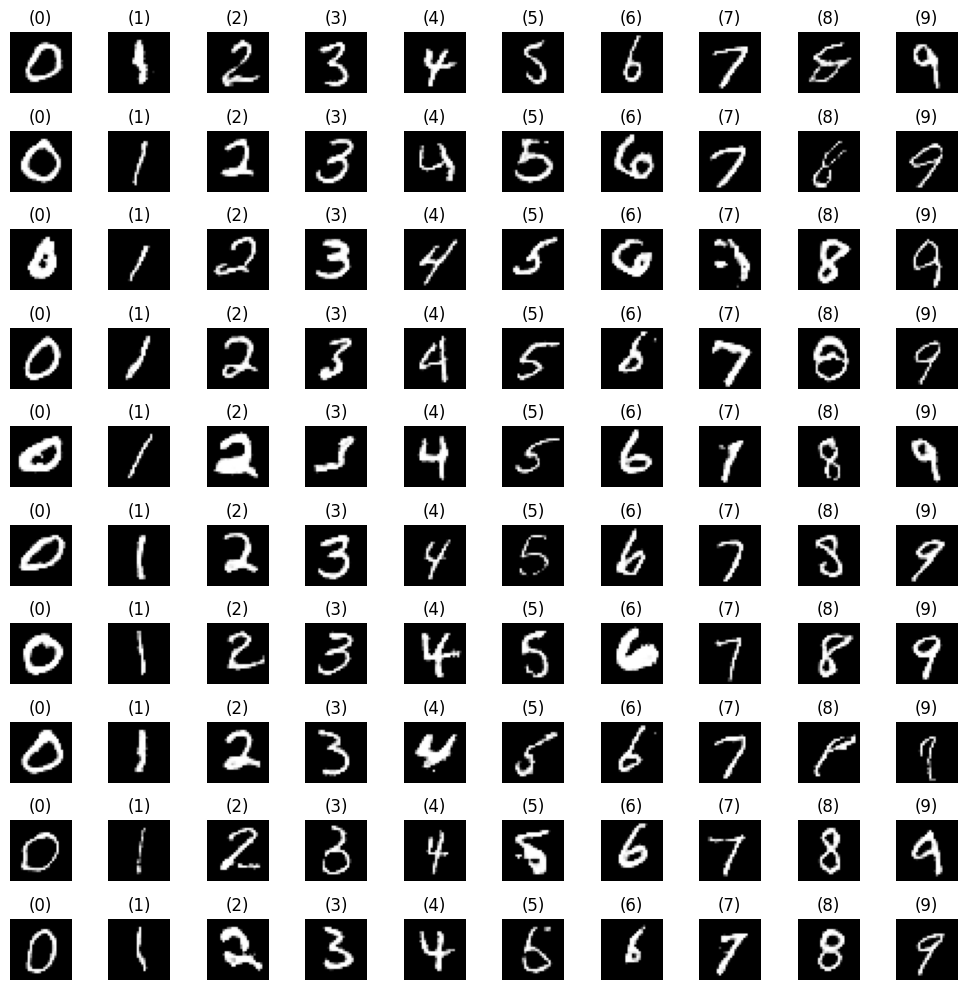

Epoch 132: Generator Loss = -0.6409288644790649, Discriminator Loss = 0.6454647779464722
4/4 [==============================] - 0s 8ms/step


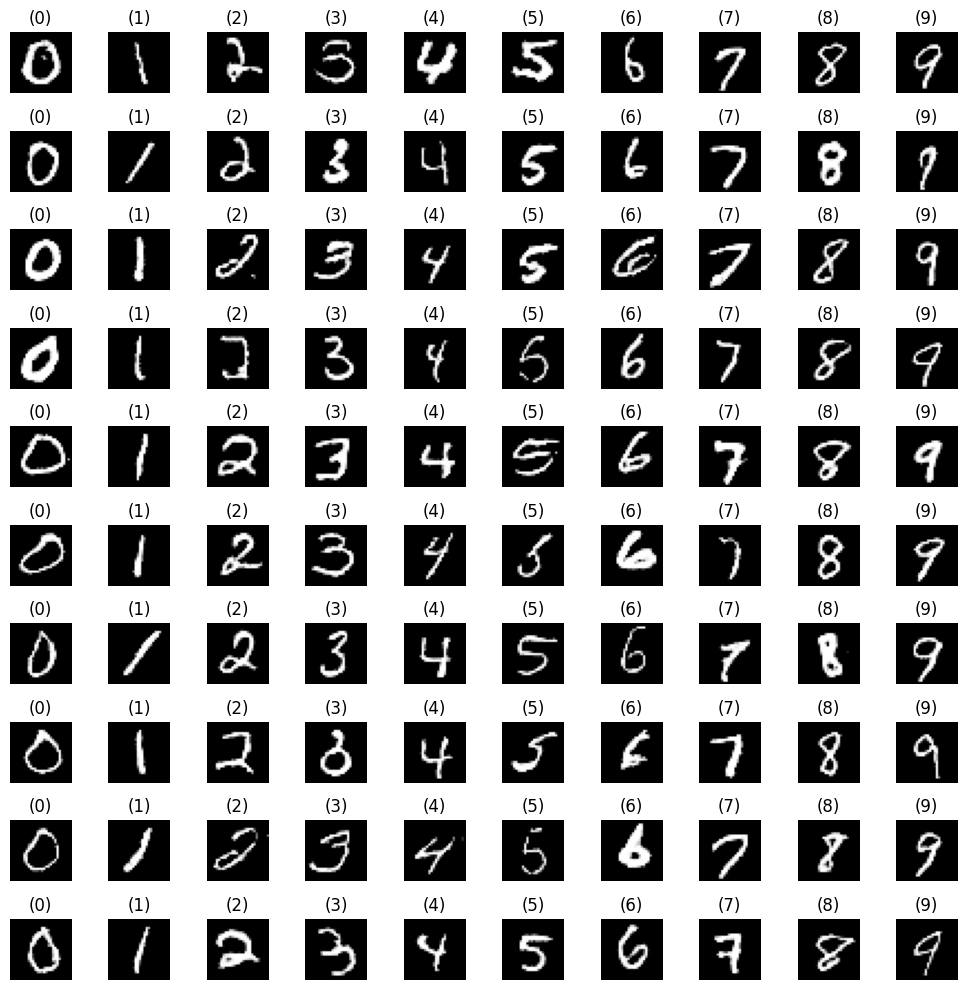

Epoch 133: Generator Loss = -0.640879213809967, Discriminator Loss = 0.6453231573104858
4/4 [==============================] - 0s 6ms/step


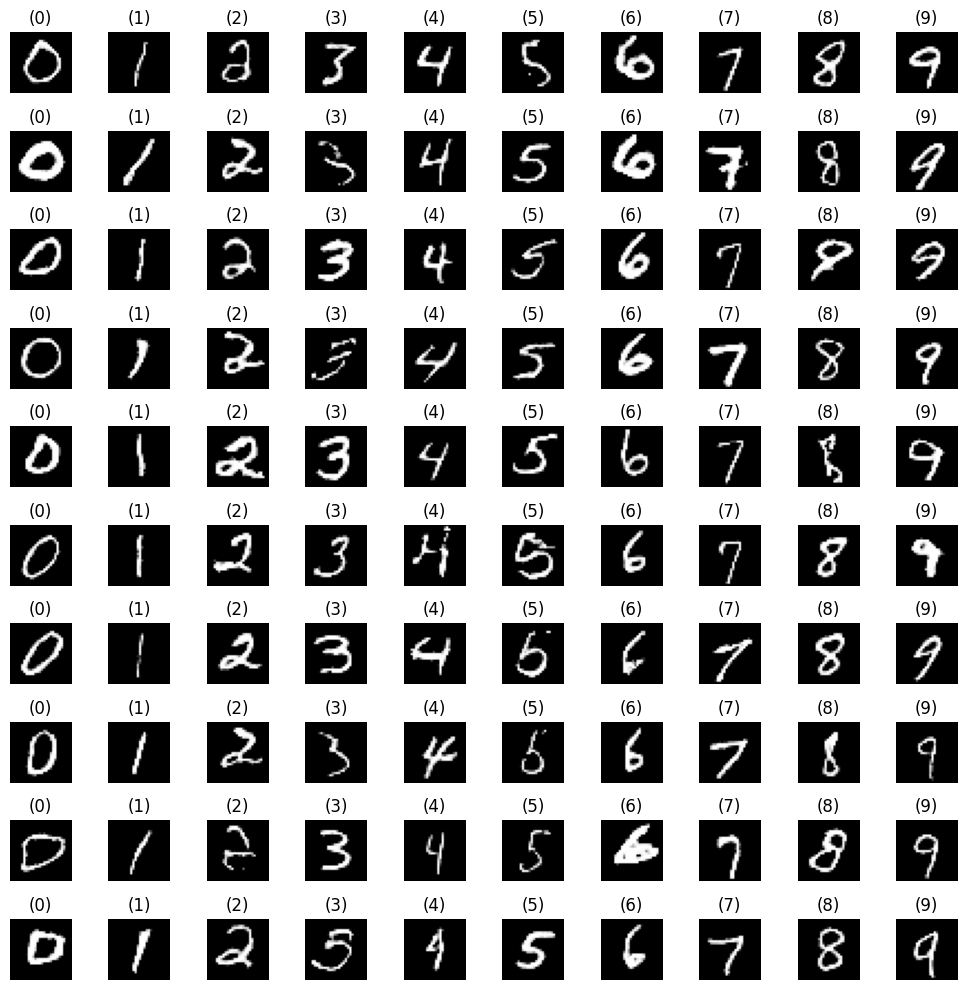

Epoch 134: Generator Loss = -0.6397682428359985, Discriminator Loss = 0.6443643569946289
4/4 [==============================] - 0s 6ms/step


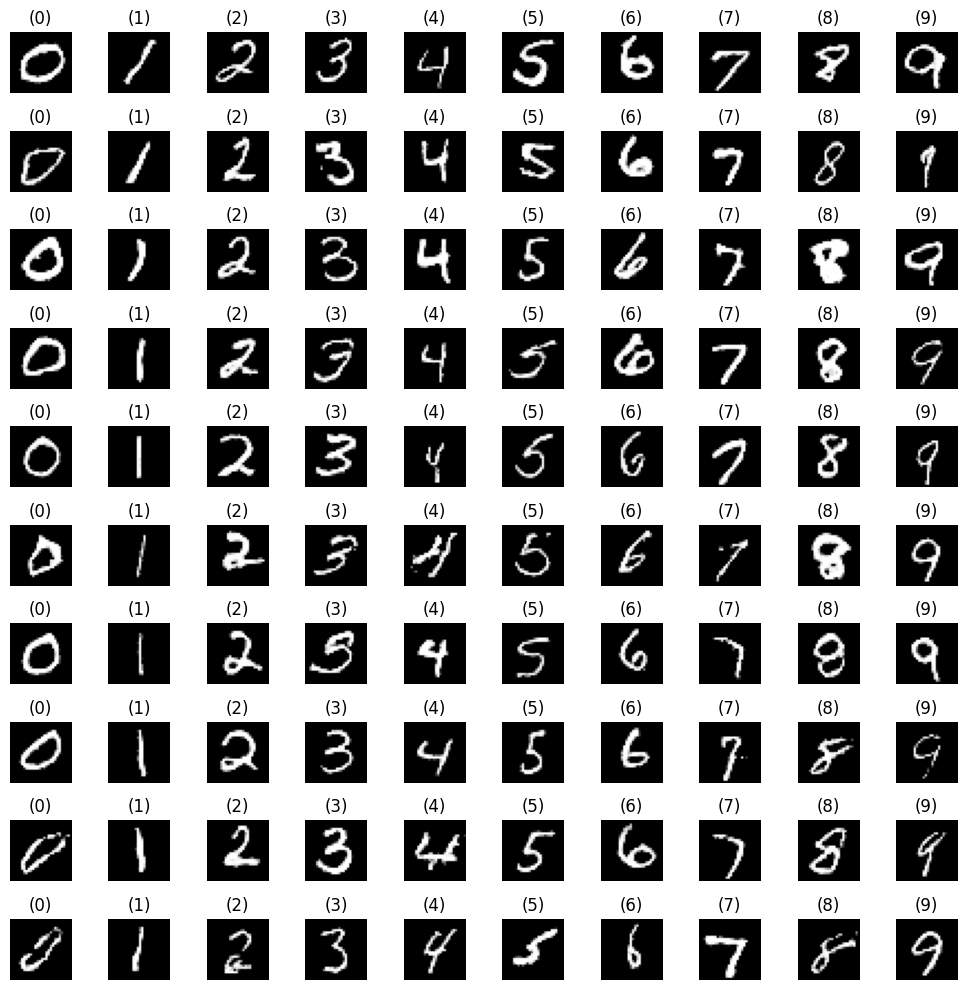

Epoch 135: Generator Loss = -0.6399405002593994, Discriminator Loss = 0.6444244384765625
4/4 [==============================] - 0s 7ms/step


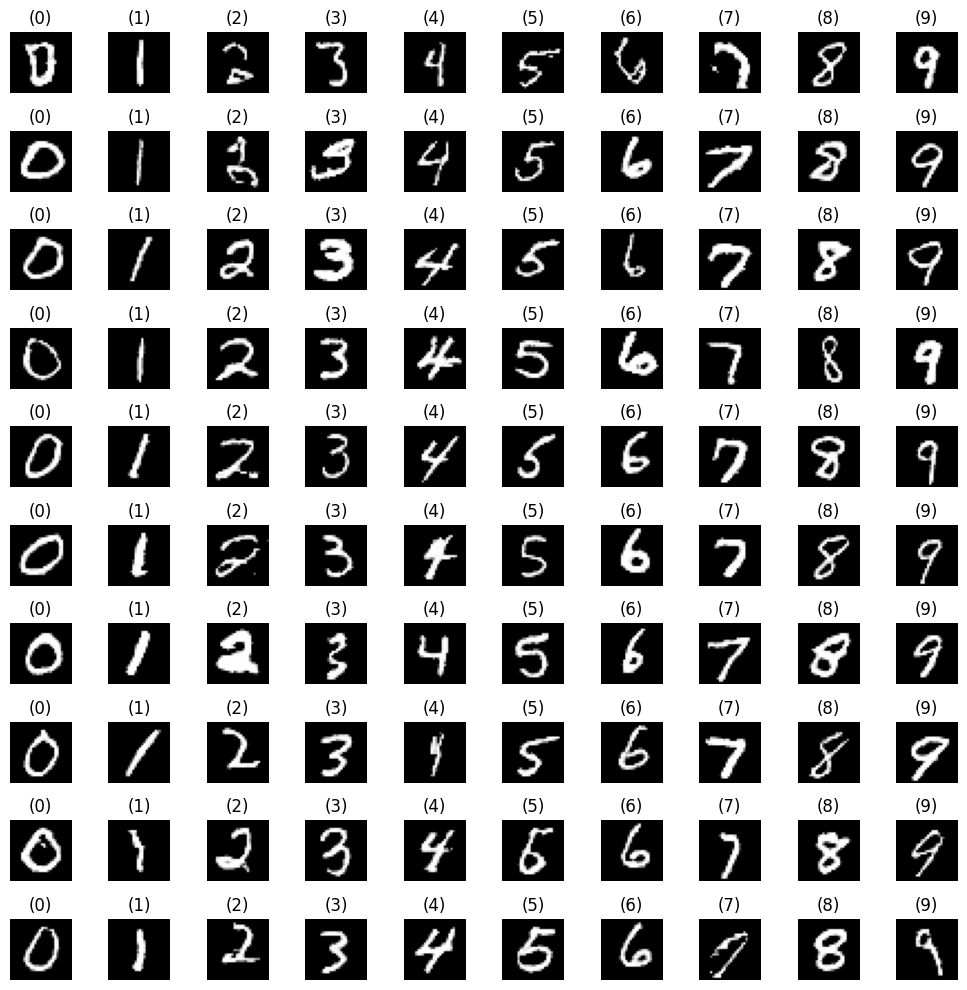

Epoch 136: Generator Loss = -0.6417165398597717, Discriminator Loss = 0.6459425091743469
4/4 [==============================] - 0s 7ms/step


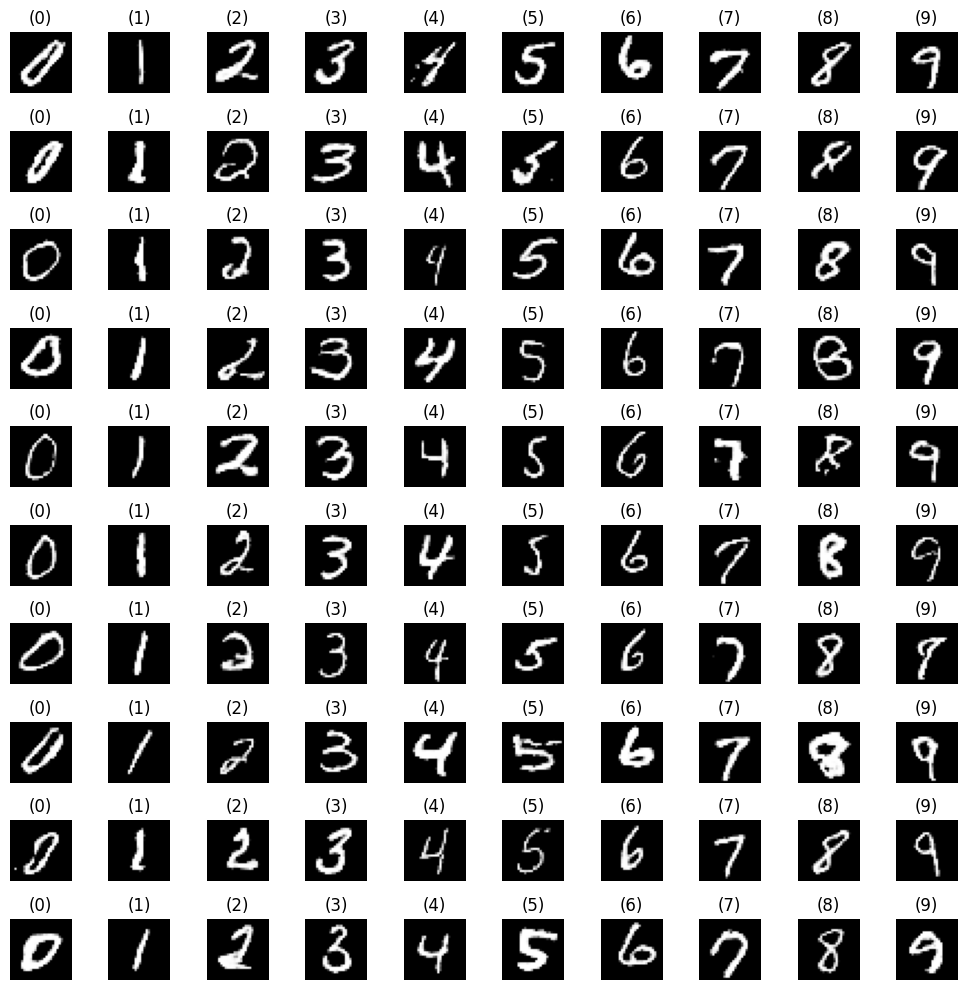

Epoch 137: Generator Loss = -0.6414217352867126, Discriminator Loss = 0.6460337042808533
4/4 [==============================] - 0s 8ms/step


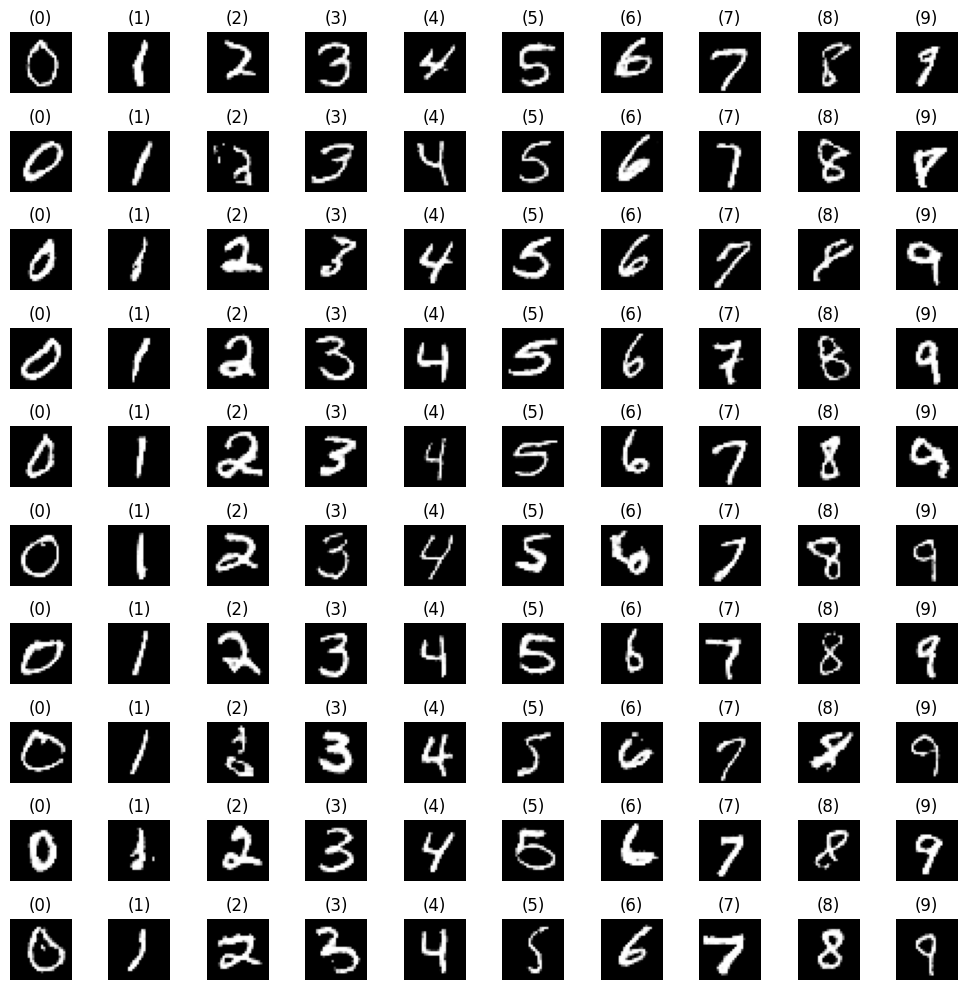

Epoch 138: Generator Loss = -0.6410036087036133, Discriminator Loss = 0.6456711888313293
4/4 [==============================] - 0s 13ms/step


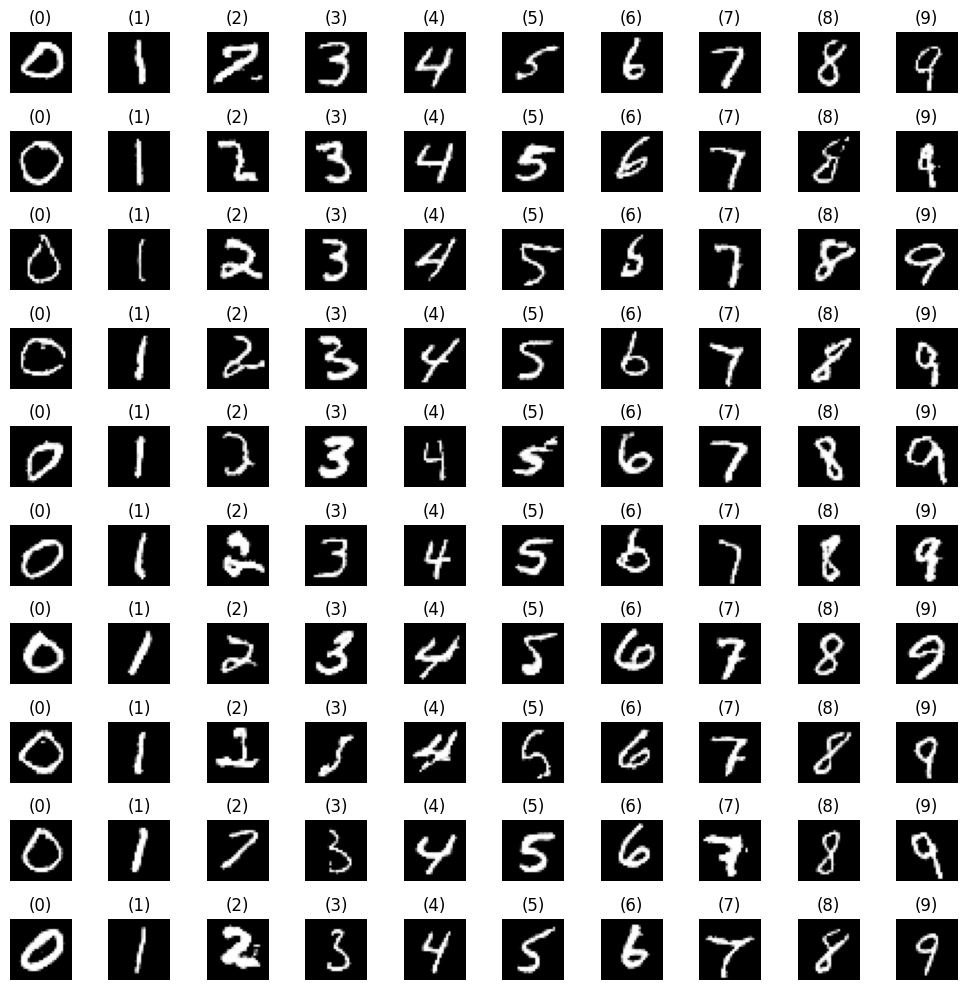

Epoch 139: Generator Loss = -0.6407822370529175, Discriminator Loss = 0.6454347372055054
4/4 [==============================] - 0s 6ms/step


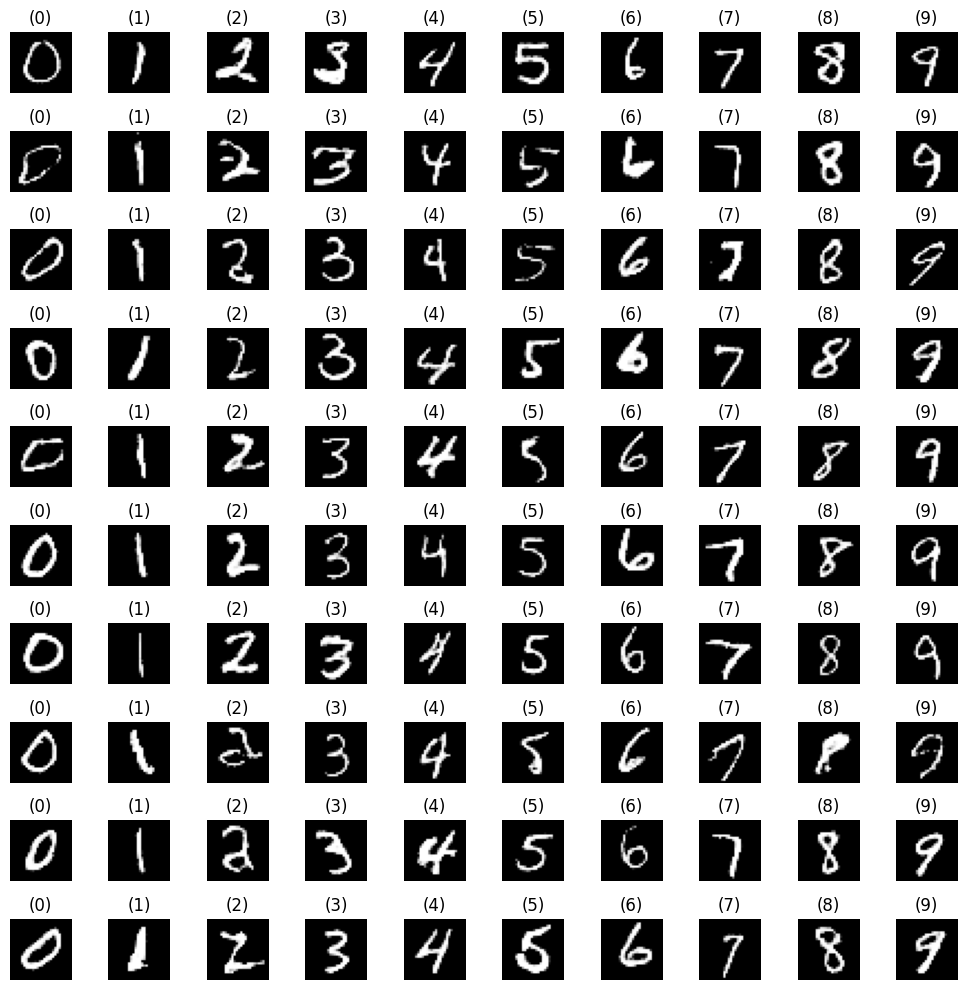

Epoch 140: Generator Loss = -0.6403936147689819, Discriminator Loss = 0.6452497243881226
4/4 [==============================] - 0s 10ms/step


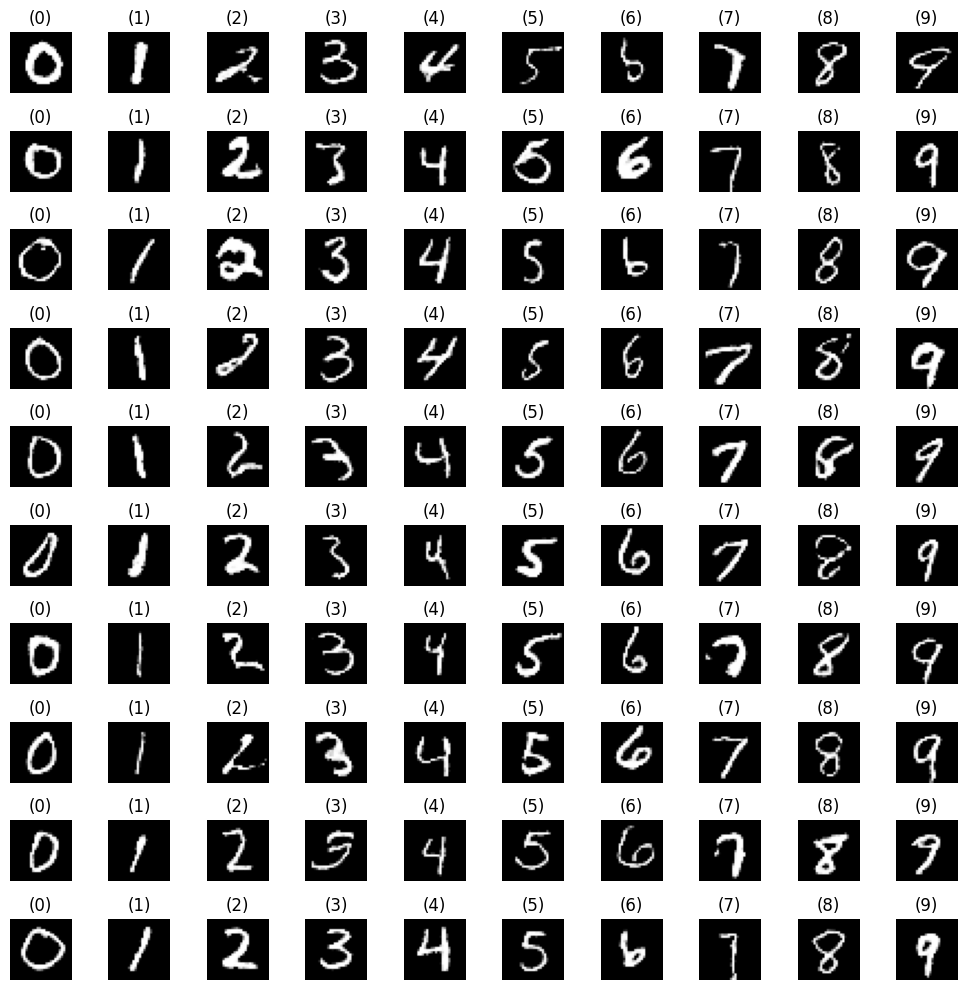

Epoch 141: Generator Loss = -0.6413146257400513, Discriminator Loss = 0.645871639251709
4/4 [==============================] - 0s 8ms/step


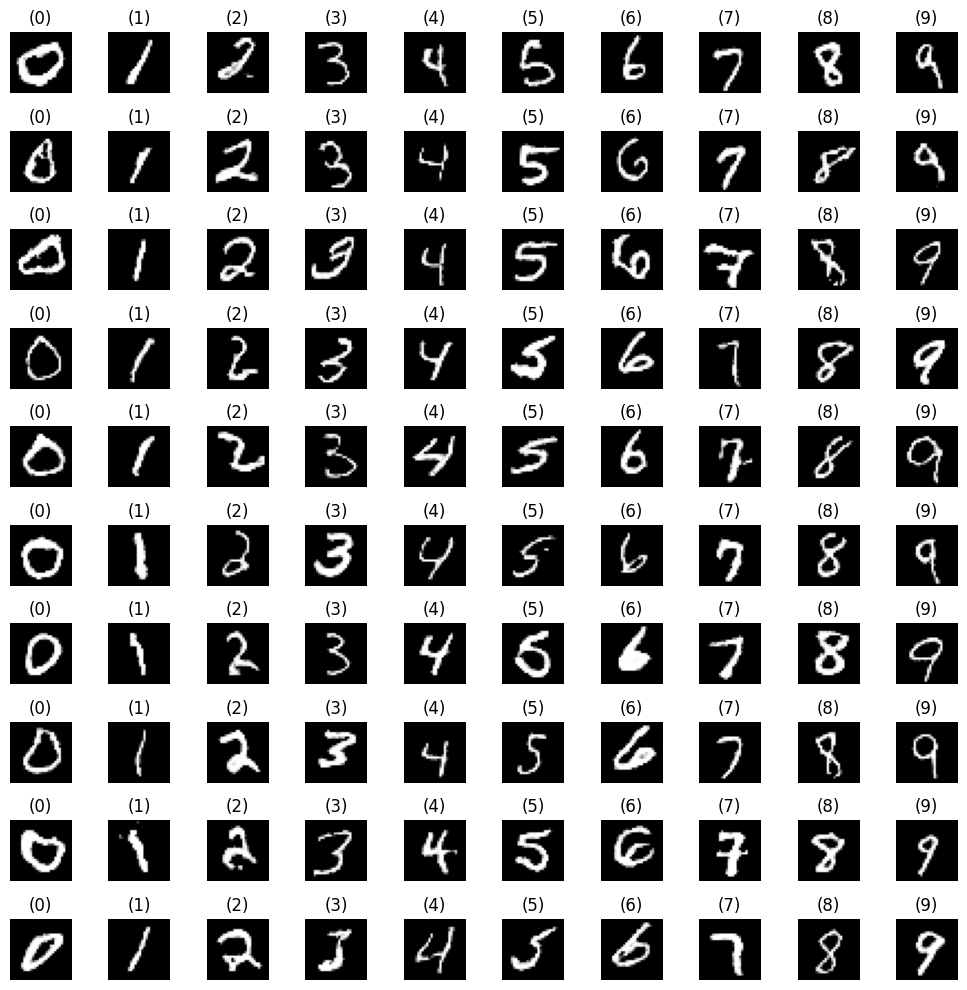

Epoch 142: Generator Loss = -0.6411774754524231, Discriminator Loss = 0.6457037925720215
4/4 [==============================] - 0s 6ms/step


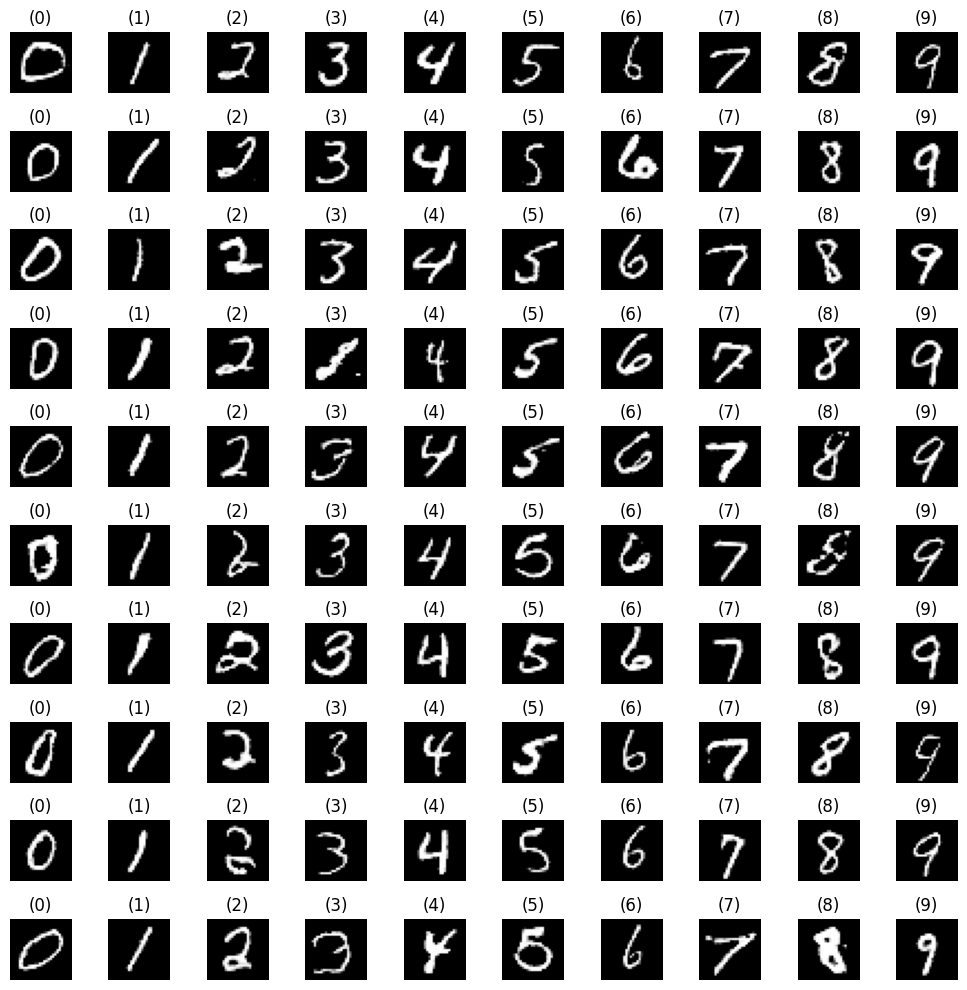

Epoch 143: Generator Loss = -0.6415174603462219, Discriminator Loss = 0.6459929347038269
4/4 [==============================] - 0s 7ms/step


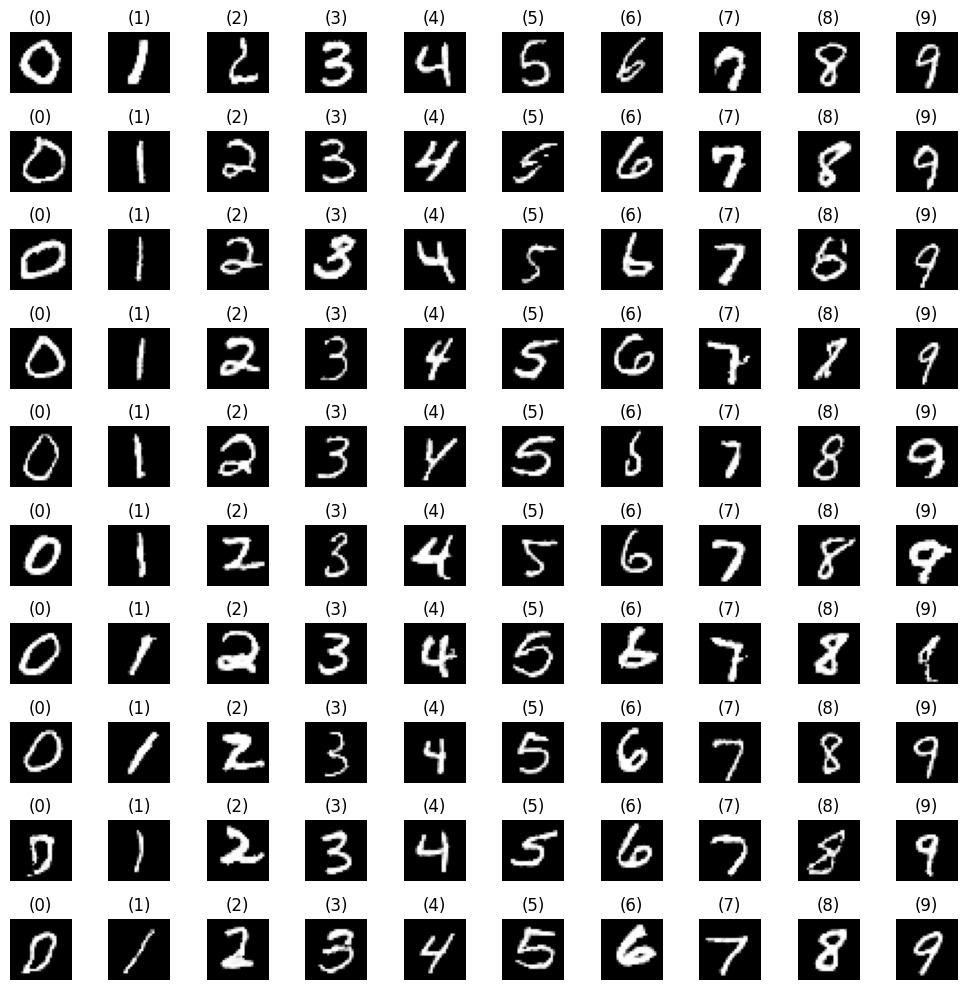

Epoch 144: Generator Loss = -0.6406620144844055, Discriminator Loss = 0.6454452276229858
4/4 [==============================] - 0s 5ms/step


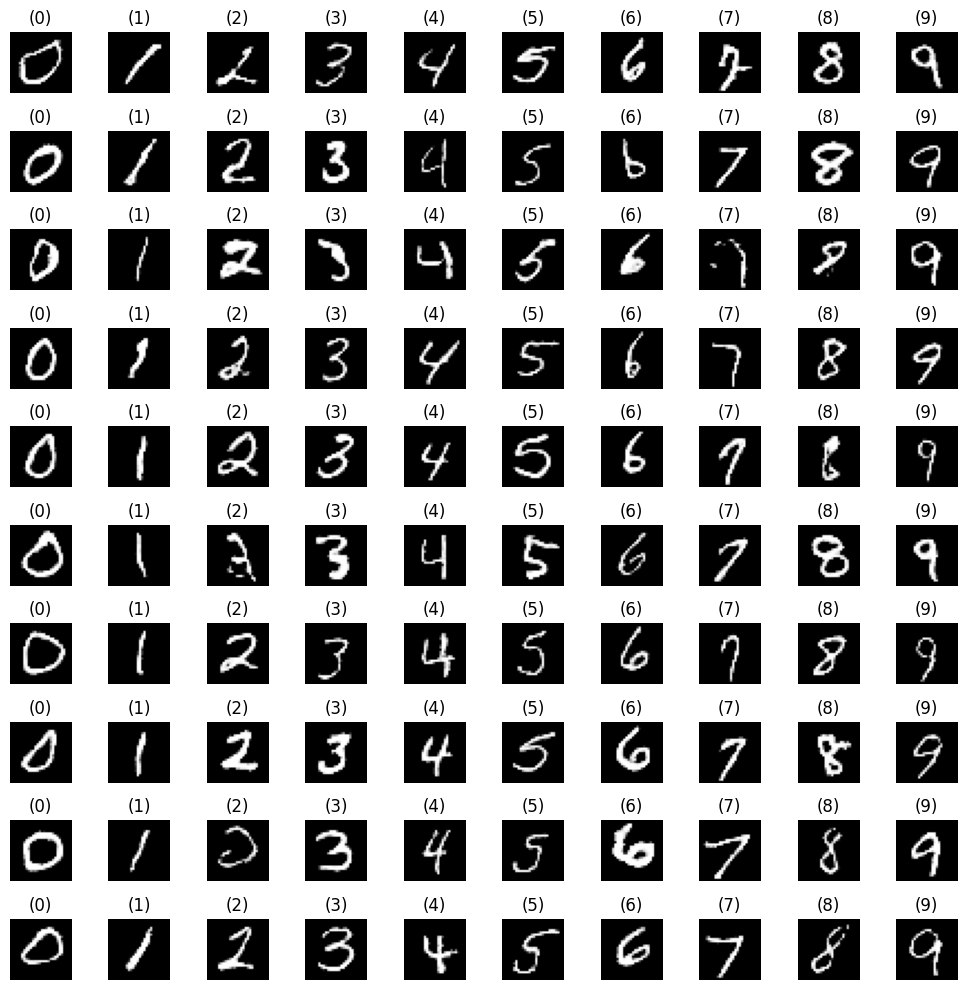

Epoch 145: Generator Loss = -0.642490804195404, Discriminator Loss = 0.6468906998634338
4/4 [==============================] - 0s 12ms/step


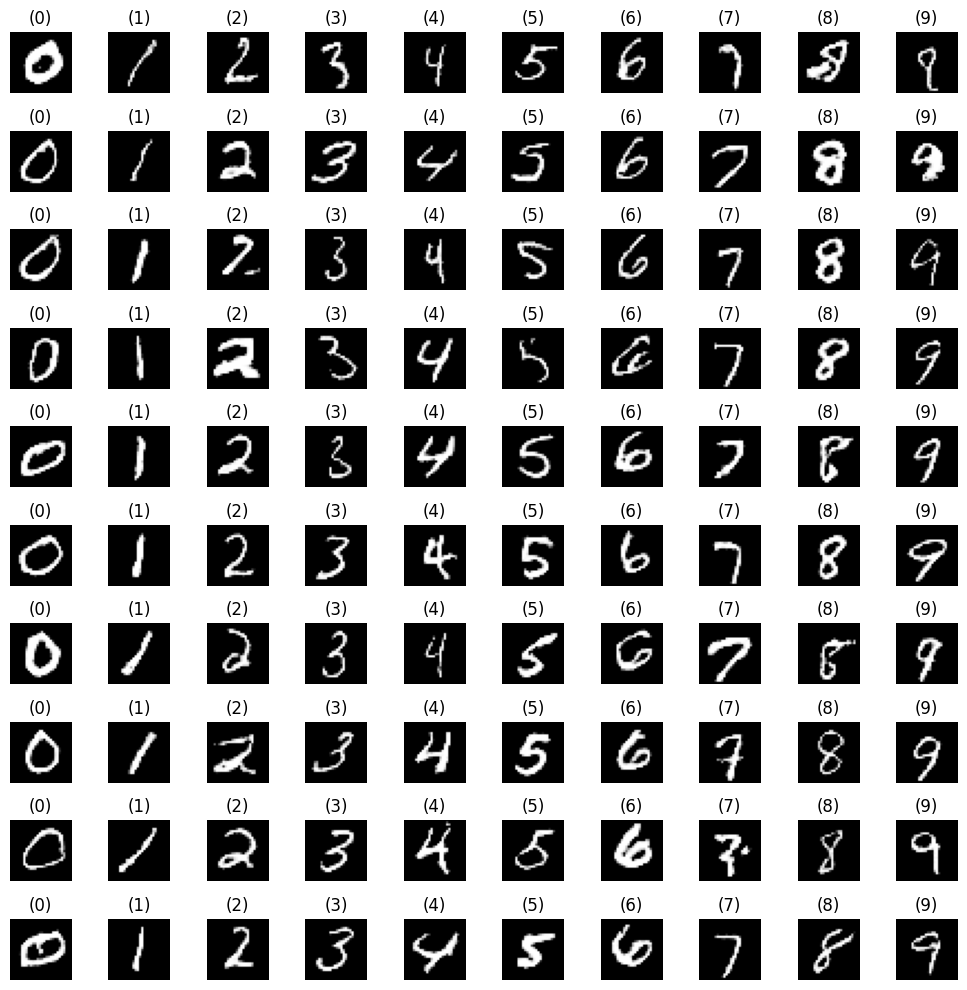

Epoch 146: Generator Loss = -0.6418319940567017, Discriminator Loss = 0.6463701725006104
4/4 [==============================] - 0s 6ms/step


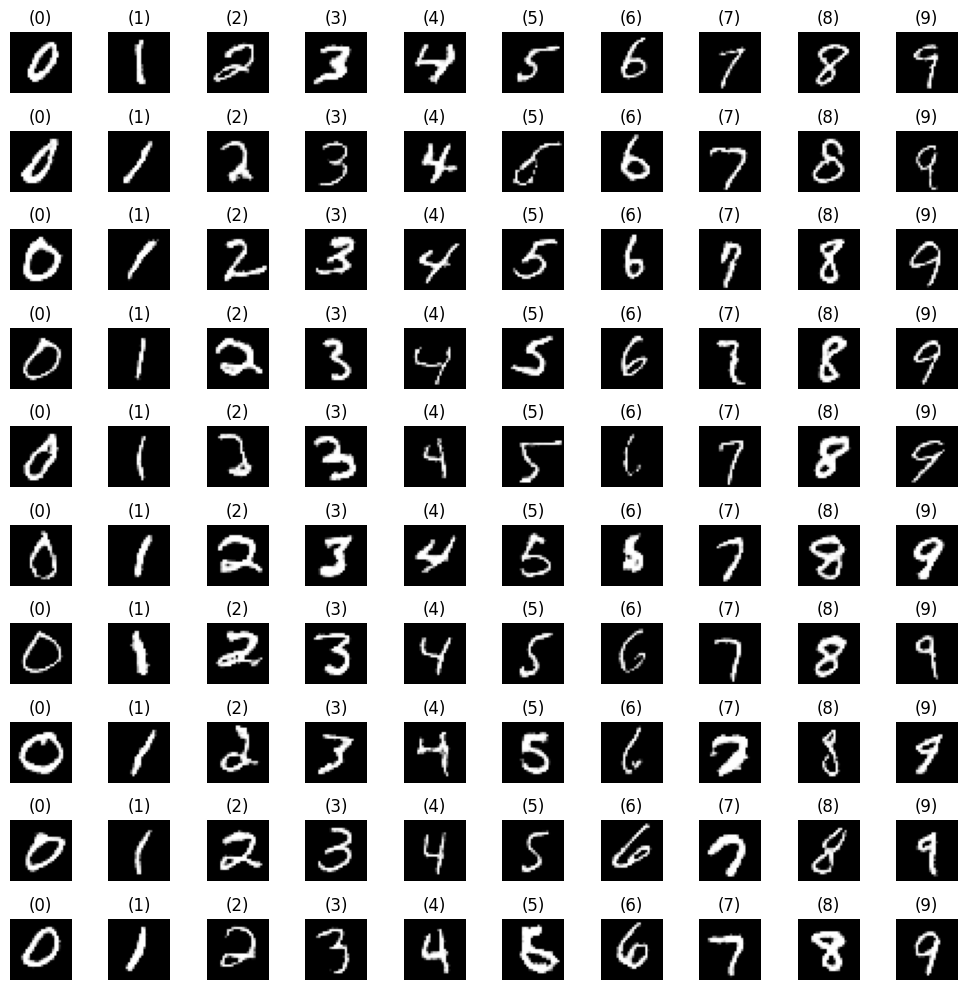

Epoch 147: Generator Loss = -0.6418358087539673, Discriminator Loss = 0.6462286114692688
4/4 [==============================] - 0s 8ms/step


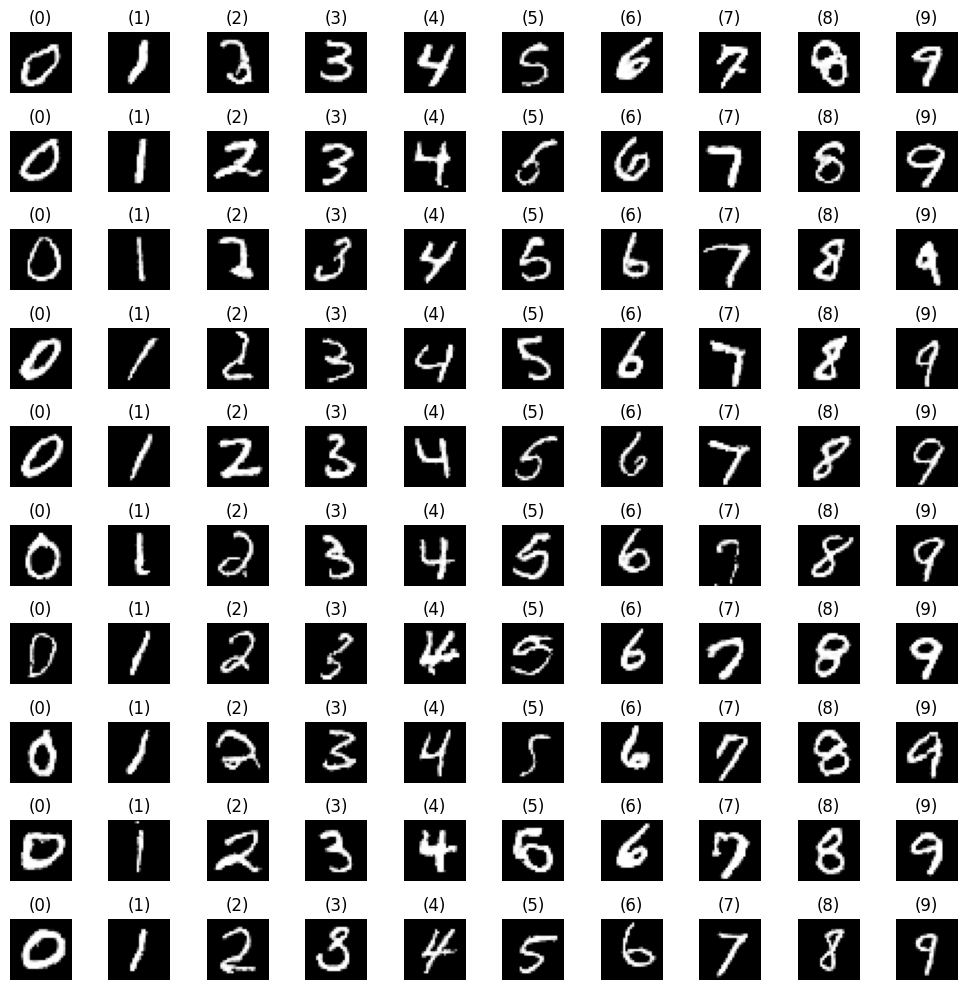

Epoch 148: Generator Loss = -0.6415847539901733, Discriminator Loss = 0.6461290717124939
4/4 [==============================] - 0s 8ms/step


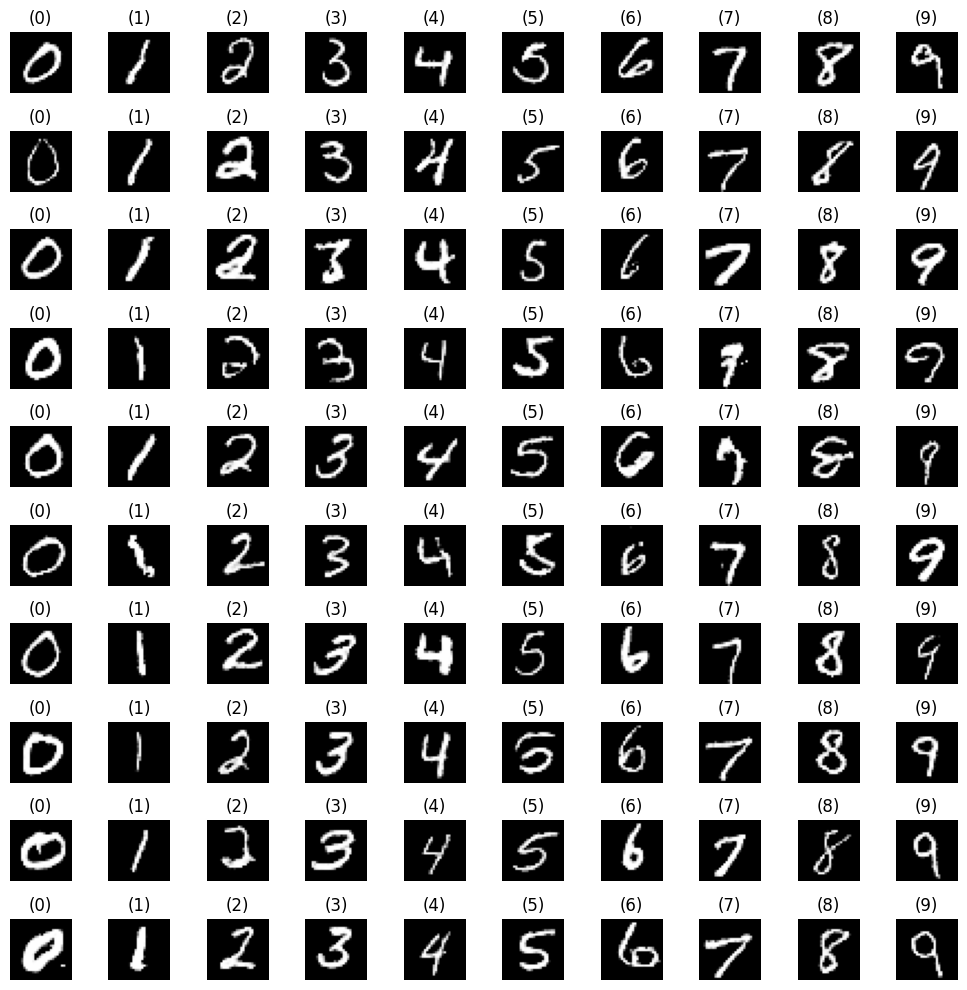

Epoch 149: Generator Loss = -0.6412466168403625, Discriminator Loss = 0.6458204388618469
4/4 [==============================] - 0s 5ms/step


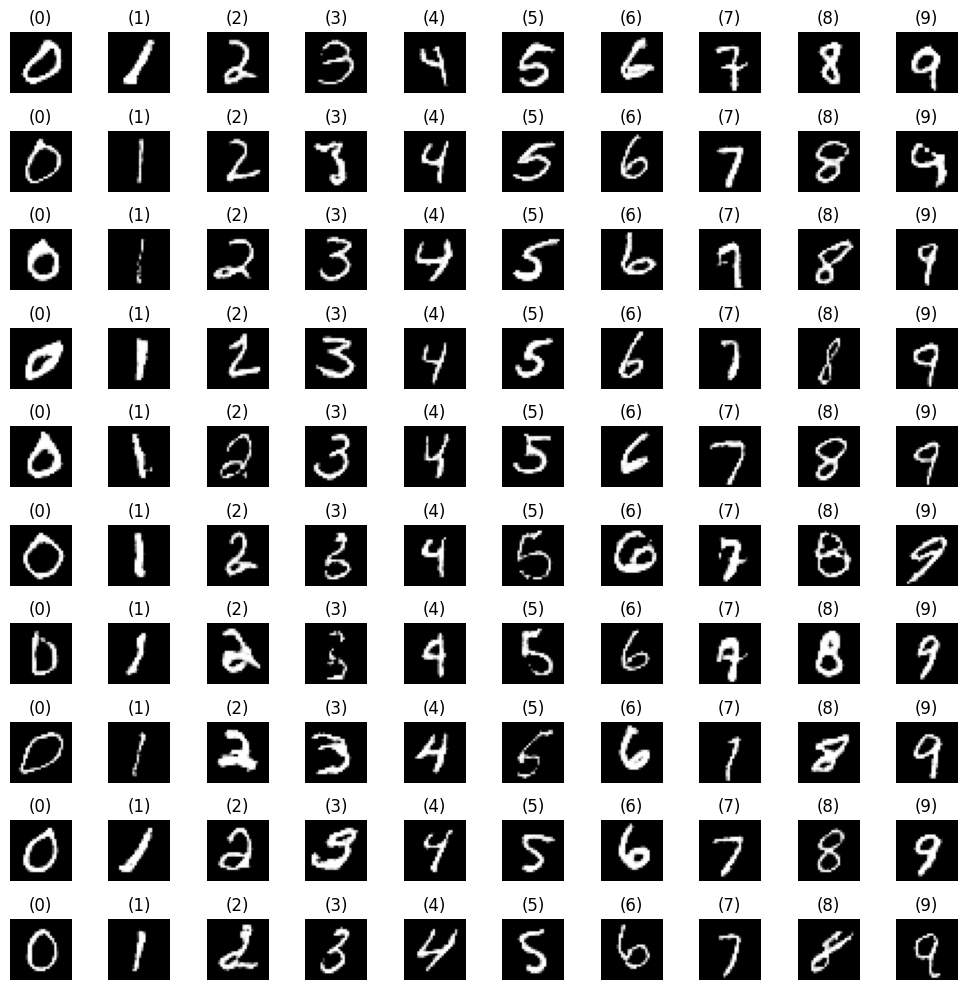

Epoch 150: Generator Loss = -0.6432122588157654, Discriminator Loss = 0.6475152373313904


In [ ]:
#resuming training from 101 epochs
curr_epoch = 101
epochs = 150

save_interval = 2
# Training loop
for epoch in range(curr_epoch, epochs+1):
    total_generator_loss = 0.0
    total_discriminator_loss = 0.0
    num_batches = 0
    # Loop over the dataset
    for real_images,real_labels in training_dataset:
        # Generate random noise as input to the generator
        noise = np.random.randn(BATCH_SIZE*latent_dim)
        noise = noise.reshape(BATCH_SIZE,latent_dim)
        fake_labels = np.random.randint(0,10,latent_dim)
        # Perform a single training step
        generator_loss, discriminator_loss = train_step(real_images, noise,fake_labels,real_labels)
        total_generator_loss += generator_loss
        total_discriminator_loss += discriminator_loss
        num_batches += 1
    # Calculating Avg loss for 600 Batches
    avg_generator_loss = total_generator_loss / num_batches
    avg_discriminator_loss = total_discriminator_loss / num_batches
    # Displaying and Saving Images
    show_images(name = epoch,save=False)
    # Saving the model
    if (epoch) % save_interval == 0:
        save_model(name = epoch)


    # Print the losses for the current epoch
    print(f"Epoch {epoch}: Generator Loss = {avg_generator_loss}, Discriminator Loss = {avg_discriminator_loss}")

# Saving the model in h5 format as well

In [ ]:
generator.save('content/gdrive/MyDrive/Project/Model/Generator/Final_model.h5')
discriminator.save('content/gdrive/MyDrive/Project/Model/Discriminator/Final_model.h5')

4/4 [==============================] - 0s 8ms/step


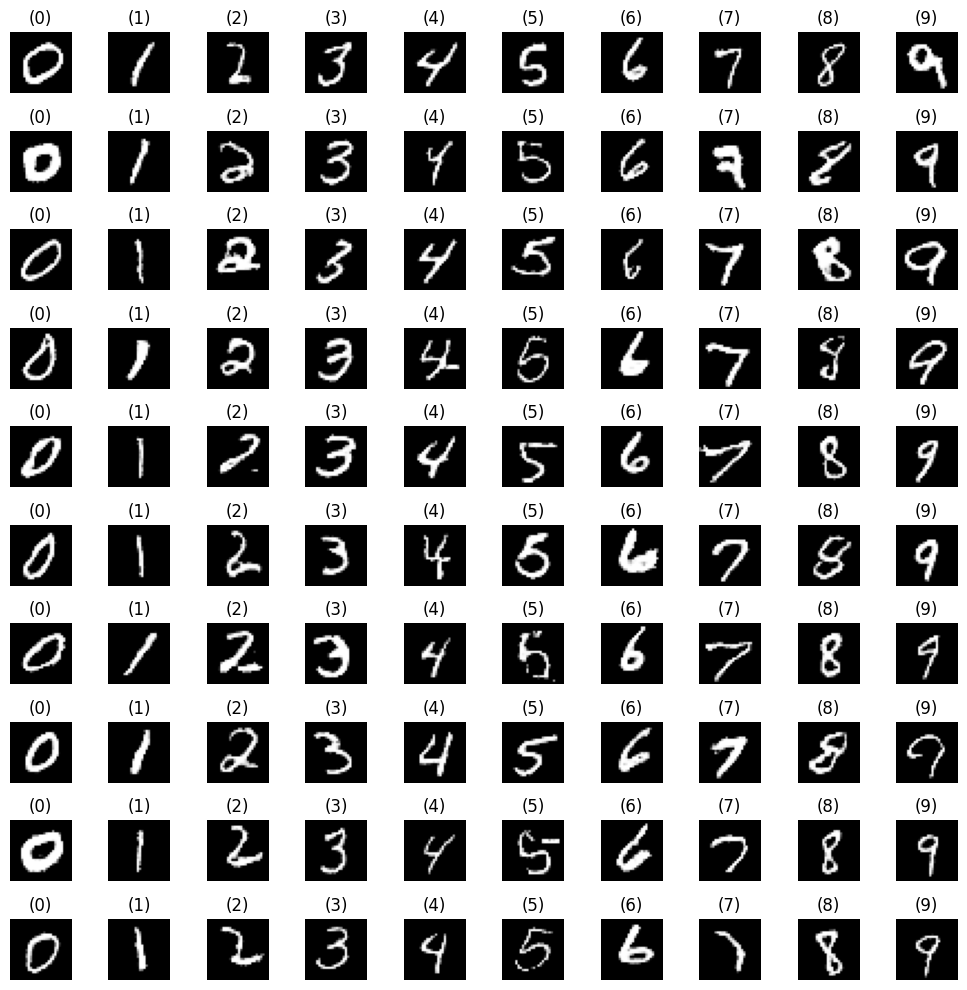

In [ ]:
show_images()

4/4 [==============================] - 0s 7ms/step


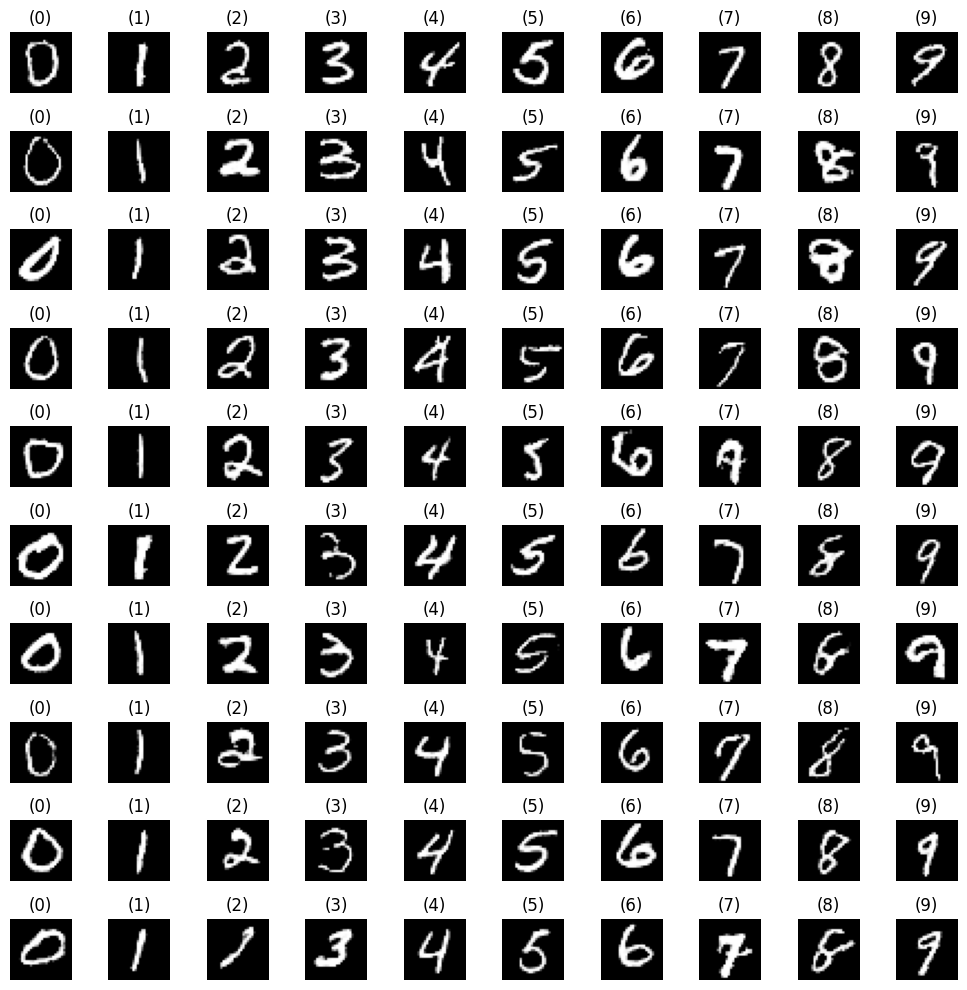

In [ ]:
show_images()